# Introduction

**Welcome to the "Jigsaw Multilingual Toxic Comment Classification" with enrisred data using the South African Xenophobic dataset my name is Calson Netshikulwe and this is my CapStone project! In this project, we aim to develop machine learning models capable of detecting toxicity in online conversations. Toxicity is defined as any comment that is rude, disrespectful, or likely to discourage participation in discussions. Addressing this issue is crucial, as even a single toxic comment can disrupt the flow of dialogue and create a negative atmosphere. By effectively identifying and filtering out toxic comments, we can foster a safer, more collaborative online environment, ultimately enhancing productivity and well-being.**

**In this analysis, I will utilize Plotly and Matplotlib to explore the data visually. Additionally, I will demonstrate how various deep learning models, implemented with TensorFlow and Keras, can be applied to detect toxic comments with precision. I will be looking at the NGUNI languages in Africa as well as other languages across the board**

# Install Libraries

In [1]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))


Num GPUs Available:  2


In [3]:
!pip install -q pyicu


In [4]:
!pip install -q pycld2


In [5]:
!pip install -q polyglot


In [6]:
!pip install -q textstat


In [8]:
!pip install -q googletrans

In [9]:
!pip install colorama

In [10]:
!pip install langdetect

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.5/981.5 kB 12.6 MB/s eta 0:00:0000:0100:01
  Preparing metadata (setup.py) ... done
  Created wheel for langdetect: filename=langdetect-1.0.9-py3-none-any.whl size=993227 sha256=6444ba9b66682792d73f672c95cf162ee3c38d0ad913558a8bc21c5aa8164a60
  Stored in directory: /root/.cache/pip/wheels/95/03/7d/59ea870c70ce4e5a370638b5462a7711ab78fba2f655d05106
Successfully built langdetect


# Aknowledgements 

<iframe src="https://www.kaggle.com/embed/tarunpaparaju/jigsaw-multilingual-toxicity-eda-models?cellIds=5&kernelSessionId=31033305" height="300" style="margin: 0 auto; width: 100%; max-width: 950px;" frameborder="0" scrolling="auto" title="Jigsaw Multilingual Toxicity : EDA + Models 🤬"></iframe>

Stop the S@#! - Toxic Comments EDA ~ by Jagan
Google Translate API (googletrans) ~ by ssut
Polyglot ~ by aboSamoor
Dale–Chall readability formula ~ by Wikipedia
Automated readability index ~ by Wikipedia
Flesch–Kincaid readability tests ~ by Wikipedia
BERT Explained: State of the art language model for NLP ~ by Rani Horev



# EDA

First we are going to do som in depth EDA before moving into the models.

In this CAPSTONE project I have 2 very imporatant notebooks the data notebook outlines the diffrent data that we have and how we complile it further for analysis. **** You can view this notebook on the input file.****

### Import Libraries 

In [11]:
import os
import pandas as pd
import tensorflow as tf
import numpy as np
import warnings
warnings.filterwarnings("ignore")
import gc
import re
import folium
import textstat
from scipy import stats
from colorama import Fore, Back, Style, init

import math
import numpy as np
import scipy as sp
import pandas as pd

import random
import networkx as nx
from pandas import Timestamp

from PIL import Image
from IPython.display import SVG
from keras.utils import model_to_dot

import requests
from IPython.display import HTML

import seaborn as sns
from tqdm import tqdm
import matplotlib.cm as cm
import matplotlib.pyplot as plt

tqdm.pandas()

import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

import transformers
import tensorflow as tf

from tensorflow.keras.callbacks import Callback
from sklearn.metrics import accuracy_score, roc_auc_score
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, CSVLogger

from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tokenizers import BertWordPieceTokenizer
from tensorflow.keras.layers import Dense, Input, Dropout, Embedding
from tensorflow.keras.layers import LSTM, GRU, Conv1D, SpatialDropout1D

from tensorflow.keras import layers
from tensorflow.keras import optimizers
from tensorflow.keras import activations
from tensorflow.keras import constraints
from tensorflow.keras import initializers
from tensorflow.keras import regularizers

import tensorflow.keras.backend as K
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.activations import *
from tensorflow.keras.constraints import *
from tensorflow.keras.initializers import *
from tensorflow.keras.regularizers import *

from sklearn import metrics
from sklearn.utils import shuffle
from gensim.models import Word2Vec
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.feature_extraction.text import TfidfVectorizer,\
                                            CountVectorizer,\
                                            HashingVectorizer

from nltk.stem.wordnet import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from nltk.tokenize import TweetTokenizer

import nltk
from textblob import TextBlob

from nltk.corpus import wordnet
from nltk.corpus import stopwords
from googletrans import Translator
from nltk import WordNetLemmatizer
from polyglot.detect import Detector
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud, STOPWORDS
from nltk.sentiment.vader import SentimentIntensityAnalyzer

stopword=set(STOPWORDS)

lem = WordNetLemmatizer()
tokenizer=TweetTokenizer()

np.random.seed(0)

### Load and Concantenate datasets

In [12]:
val_data = pd.read_csv("/kaggle/input/comment-classification-with-twit-and-jigsaw-data/validation.csv")
test_data = pd.read_csv("/kaggle/input/comment-classification-with-twit-and-jigsaw-data/test.csv")
train_data = pd.read_csv("/kaggle/input/comment-classification-with-twit-and-jigsaw-data/jigsaw-toxic-comment-train.csv")

In [13]:
# Load the South African datasets
sa_train_data = pd.read_csv("/kaggle/input/transformed-sa-data-train/transformed_sa_dataset_train.csv")
sa_test_data = pd.read_csv("/kaggle/input/south-african-twit-data-test/progress (1).csv")

In [14]:
# Concatenate the train datasets
train_data = pd.concat([train_data, sa_train_data], ignore_index=True)

# Concatenate the test datasets
test_data = pd.concat([test_data, sa_test_data], ignore_index=True)


In [15]:
val_data.head()

,id,comment_text,lang,toxic
0,0,Este usuario ni siquiera llega al rango de ...,es,0
1,1,Il testo di questa voce pare esser scopiazzato...,it,0
2,2,Vale. Sólo expongo mi pasado. Todo tiempo pasa...,es,1
3,3,Bu maddenin alt başlığı olarak uluslararası i...,tr,0
4,4,Belçika nın şehirlerinin yanında ilçe ve belde...,tr,0


In [16]:
train_data.head()

,id,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate
0,0000997932d777bf,Explanation\nWhy the edits made under my usern...,0,0,0,0,0,0
1,000103f0d9cfb60f,D'aww! He matches this background colour I'm s...,0,0,0,0,0,0
2,000113f07ec002fd,"Hey man, I'm really not trying to edit war. It...",0,0,0,0,0,0
3,0001b41b1c6bb37e,"""\nMore\nI can't make any real suggestions on ...",0,0,0,0,0,0
4,0001d958c54c6e35,"You, sir, are my hero. Any chance you remember...",0,0,0,0,0,0


In [17]:
test_data.head()

,id,content,lang
0,0,Doctor Who adlı viki başlığına 12. doctor olar...,tr
1,1,"Вполне возможно, но я пока не вижу необходимо...",ru
2,2,"Quindi tu sei uno di quelli conservativi , ...",it
3,3,Malesef gerçekleştirilmedi ancak şöyle bir şey...,tr
4,4,:Resim:Seldabagcan.jpg resminde kaynak sorunu ...,tr


### Basic Visuals

In [18]:
def nonan(x):
    if type(x) == str:
        return x.replace("\n", "")
    else:
        return ""

text = ' '.join([nonan(abstract) for abstract in train_data["comment_text"]])
wordcloud = WordCloud(max_font_size=None, background_color='black', collocations=False,
                      width=1200, height=1000).generate(text)
fig = px.imshow(wordcloud)
fig.update_layout(title_text='Common words in comments')

In the word cloud above, we can see the most common words in the comments. These include terms like "wikipedia," "page," and "article," among others. More offensive words, such as "f**k," appear to be less frequent, highlighting that toxic and insulting comments are relatively rare compared to non-toxic comments in this dataset. However, it’s important to note that toxic comments have become more prominent across social media, reflecting a growing concern for maintaining respectful online discussions.



### Detecting languages in data

Now, I will analyze the distribution of languages in the dataset. To detect the language of the comments, I utilized the Polyglot package, which takes text as input and predicts its language. Before applying the language detection, we will preprocess the text to remove unwanted typos and ensure accuracy in our analysis.



In [19]:
from langdetect import detect, DetectorFactory

# Set a seed for reproducibility
DetectorFactory.seed = 0

# Step 1: Clean the comment_text column
train_data['comment_text'] = train_data['comment_text'].astype(str)  # Convert everything to string
train_data['comment_text'] = train_data['comment_text'].str.replace(r'[^\x00-\x7F]+', '', regex=True)  # Remove non-printable characters
train_data['comment_text'] = train_data['comment_text'].str.strip()  # Remove leading/trailing spaces



In [20]:
def get_language(text):
    return Detector("".join(x for x in text if x.isprintable()), quiet=True).languages[0].name

train_data["lang"] = train_data["comment_text"].progress_apply(get_language)

100%|██████████| 239461/239461 [00:23<00:00, 10071.94it/s]


In [22]:
# Create a DataFrame with your data
data = {
    "Language": ["English", "Non-English"],
    "Count": [236278, 3183]
}
df = pd.DataFrame(data)

# Create a bar plot
fig = px.bar(df, x="Language", y="Count", title="Language of Comments", color="Language", text="Count")

# Update layout
fig.update_layout(template="plotly_white")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig.data[1].marker.line.color = 'rgb(0, 0, 0)'
fig.data[1].marker.line.width = 0.5
fig.data[0].textfont.color = "black"
fig.data[0].textposition = "outside"
fig.data[1].textfont.color = "black"
fig.data[1].textposition = "outside"

# Show the plot
fig.show()


We can see that English comments overwhelmingly dominate the training data, comprising a total of 236278 comments written in English. In stark contrast, only 3183 comments are in languages other than English. This significant imbalance in the language of comments poses challenges for effective model training, as the limited representation of non-English comments may hinder the model's ability to generalize across diverse linguistic contexts.



In [23]:
lang_list = sorted(list(set(train_data["lang"])))
counts = [list(train_data["lang"]).count(cont) for cont in lang_list]
df = pd.DataFrame(np.transpose([lang_list, counts]))
df.columns = ["Language", "Count"]
df["Count"] = df["Count"].apply(int)

df_en = pd.DataFrame(np.transpose([["English", "Non-English"], [max(counts), sum(counts) - max(counts)]]))
df_en.columns = ["Language", "Count"]

In [24]:
fig = px.bar(df.query("Language != 'English' and Language != 'un'").query("Count >= 35"),
             y="Language", x="Count", title="Language of non-English comments", template="plotly_white", color="Language", text="Count", orientation="h")
fig.update_traces(marker=dict(line=dict(width=0.75,
                                        color='black')),  textposition="outside")
fig.update_layout(showlegend=False)
fig

We can see that Danish, German, and Scots are the most common non-English languages featured in the dataset, each with more than 100 comments. Following closely are Spanish, Persian, and Arabic, along with Tsonga and the Nguni languages, Xhosa and Zulu. This suggests that Europe and the Middle East are the most represented regions in the dataset, reflecting a diverse linguistic landscape, albeit with limited representation from other regions.

In [25]:
fig = go.Figure([go.Pie(labels=df.query("Language != 'English' and Language != 'un'").query("Count >= 35")["Language"],
           values=df.query("Language != 'English' and Language != 'un'").query("Count >= 35")["Count"])])
fig.update_layout(title_text="Pie chart of non-English languages", template="plotly_white")
fig.data[0].marker.colors = [px.colors.qualitative.Plotly[2:]]
fig.data[0].textfont.color = "black"
fig.data[0].textposition = "outside"
fig.show()

In [26]:
def get_country(language):
    if language == "German":
        return "Germany"
    if language == "Scots":
        return "Scotland"
    if language == "Danish":
        return "Denmark"
    if language == "Arabic":
        return "Saudi Arabia"
    if language == "Spanish":
        return "Spain"
    if language == "Persian":
        return "Iran"
    if language == "Greek":
        return "Greece"
    if language == "Portuguese":
        return "Portugal"
    if language == "English":
        return "United Kingdom"
    if language == "Hindi":
        return "India"
    if language == "Albanian":
        return "Albania"
    if language == "Bosnian":
        return "Bosnia and Herzegovina"
    if language == "Croatian":
        return "Croatia"
    if language == "Dutch":
        return "Netherlands"
    if language == "Russian":
        return "Russia"
    if language == "Vietnamese":
        return "Vietnam"
    if language == "Somali":
        return "Somalia"
    if language == "Turkish":
        return "Turkey"
    if language == "Serbian":
        return "Serbia"
    if language == "Indonesian":
        return "Indonesia"
    if language == "Manx":
        return "Ireland"
    if language == "Scots":
        return "Scotland"
    if language == "Latin":
        return "Holy See (Vatican City State)"
    if language ==  "Zulu":
        return "South Africa"
    if language ==  "Xhosa":
        return "South Africa"
     #if language ==  "Tsonga":
        #return "South Africa"
    return "None"

df["country"] = df["Language"].progress_apply(get_country)

100%|██████████| 106/106 [00:00<00:00, 161612.59it/s]


We will not include languages like Tsonga and Afrikaans even though they are in SA since we are focusing on Nguni languages and the other languages have diffrent cultural inferences in the context of South Africa so we will filter them out when analysing the diffrent sentimements gathered across languages in Europe Asia And Africa such that we have a focused context.

In [27]:
fig = px.choropleth(df.query("Language != 'English' and Language != 'un' and country != 'None'").query("Count >= 5"), locations="country", hover_name="country",
                     projection="natural earth", locationmode="country names", title="Countries of non-English languages", color="Count",
                     template="plotly", color_continuous_scale="agsunset")
fig.show()

**From the word plot above, we can see that Western Europe and the Middle East are the most represented regions in the dataset. In contrast, Africa, Asia, and Eastern Europe are relatively under-represented. This disparity arises from the lack of properly collected and labeled data associated with hate speech in these regions, highlighting a significant gap in the dataset.**

In [28]:
fig = px.choropleth(df.query("Language != 'English' and Language != 'un' and country != 'None'"), locations="country", hover_name="country",
                     projection="natural earth", locationmode="country names", title="Non-English European countries", color="Count",
                     template="plotly", color_continuous_scale="aggrnyl", scope="europe")
fig.show()

We can see that German and English are the most common European languages represented in the dataset, with Spanish and Greek following closely behind.

In [29]:
fig = px.choropleth(df.query("Language != 'English' and Language != 'un' and country != 'None'"), locations="country", hover_name="country",
                     projection="natural earth", locationmode="country names", title="Asian countries", color="Count",
                     template="plotly", color_continuous_scale="spectral", scope="asia")
fig.show()

The visual representation presented in the plot indicates that Middle-Eastern languages, particularly Arabic and Persian, are significantly more represented in the dataset compared to languages from the Indian subcontinent and Southeast Asia, such as Hindi, Vietnamese, and Indonesian. This disparity may reflect broader trends in online discourse, where Arabic and Persian-speaking communities have established a substantial presence across various social media platforms and online forums.

In [30]:
fig = px.choropleth(df.query("Language != 'English' and Language != 'un' and country != 'None'").query("Count >= 5"), locations="country", hover_name="country",
                     projection="natural earth", locationmode="country names", title="African countries", color="Count",
                     template="plotly", color_continuous_scale="agsunset", scope="africa")
fig.show()

### Language Distribution Analysis

**The analysis of the dataset reveals that German and English are the predominant European languages present, indicating a significant representation of Western European linguistic patterns. The prominence of English can be attributed to its status as a global lingua franca, widely used in online communication and social media. Meanwhile, German, as the most widely spoken native language in the European Union, reflects the substantial online engagement of German-speaking individuals.**

**In addition to these languages, Spanish and Greek exhibit notable representation, suggesting that online discussions in these languages also contribute meaningfully to the dataset. The presence of Spanish aligns with the language's extensive usage across multiple continents, particularly in the Americas and Europe. Greek, although less prevalent, still underscores the diversity of linguistic backgrounds in the dataset.**

**The analysis indicates that while certain languages dominate the discourse, there exists a broader spectrum of languages that enrich the dataset, thereby providing a more comprehensive understanding of online interactions. However, it is essential to acknowledge that this dataset does not encompass all languages equitably, particularly from regions such as Africa and Asia. Further efforts are needed to enhance the representation of languages from these areas to foster a more inclusive linguistic analysis of online conversations.**

In [31]:
def new_len(x):
    if type(x) is str:
        return len(x.split())
    else:
        return 0

train_data["comment_words"] = train_data["comment_text"].apply(new_len)
nums = train_data.query("comment_words != 0 and comment_words < 200").sample(frac=0.1)["comment_words"]
fig = ff.create_distplot(hist_data=[nums],
                         group_labels=["All comments"],
                         colors=["coral"])

fig.update_layout(title_text="Comment words", xaxis_title="Comment words", template="simple_white", showlegend=False)
fig.show()

The histogram presented in the plot reveals that the distribution of word counts in the comments exhibits a pronounced rightward skew (positive skew), indicating that a majority of comments are relatively concise. The maximum probability density occurs at approximately 13 words, suggesting that this length is the most common among the comments analyzed.

As the word count increases beyond 13, there is a marked decline in frequency, illustrating a steep drop-off in the number of comments with greater lengths. This phenomenon suggests that users tend to express their thoughts in succinct phrases rather than extensive commentary. Such brevity may reflect the nature of online communication, where users often prioritize clarity and impact within limited character counts, particularly on platforms where comments are subject to constraints.

In [32]:
import plotly.graph_objects as go

# Ensure that 'comment_words' column is numeric, convert non-numeric to NaN
train_data["comment_words"] = pd.to_numeric(train_data["comment_words"], errors="coerce")

# Drop rows where 'comment_words' is NaN (non-numeric values)
train_data_clean = train_data.dropna(subset=["comment_words"])

# Group by 'lang' and compute mean of 'comment_words'
df = pd.DataFrame({
    "Language": train_data_clean["lang"].unique(),
    "Average_comment_words": train_data_clean.groupby("lang")["comment_words"].mean()
})

# Filter out rows where average comment words is greater than 500
df = df.query("Average_comment_words < 500")

# Create the bar plot
fig = go.Figure(go.Bar(x=df["Language"], y=df["Average_comment_words"]))

# Update the layout
fig.update_layout(
    xaxis_title="Language",
    yaxis_title="Average comment words",
    title_text="Average comment words vs. language",
    template="plotly_white"
)

# Show the plot
fig.show()


In the plot above, we have visualized the average number of words per comment across various languages. Interestingly, certain languages exhibit significantly higher average word counts compared to others. Notably, comments written in Akan, Persian, and Sinhala demonstrate an average of over 300 words per comment. This anomaly could be attributed to the relatively small sample size in these languages, where a few outlier comments disproportionately inflate the overall average.

In the context of South African languages, we can observe that Venda and Southern Sotho are included in the dataset, albeit with fewer comments compared to more widely spoken languages. However, for the purposes of this project, the analysis will place particular emphasis on Nguni languages (such as Xhosa and Zulu) as they are more representative of the linguistic diversity of the region. In addition to this regional focus, we will also examine major languages from other continents to ensure a more comprehensive multilingual toxic comment classification approach.

By concentrating on these languages, we aim to develop a deeper understanding of the linguistic patterns and challenges associated with detecting toxicity in diverse cultural and linguistic contexts. This focus will also help address the underrepresentation of African languages in toxic comment datasets, contributing to the development of more inclusive and globally effective machine learning models.

In [33]:
df["country"] = df["Language"].apply(get_country)
df = df.query("country != 'None'")

fig = px.choropleth(df, locations="country", hover_name="country",
                     projection="natural earth", locationmode="country names", title="Average comment length vs. Country", color="Average_comment_words",
                     template="plotly", color_continuous_scale="aggrnyl")
fig

This pattern contrasts sharply with the comment lengths observed in Western Europe and North America, where languages like English and German tend to have shorter average comment lengths. The differences in average comment length across regions suggest that toxicity detection models must account for language-specific and cultural factors that influence online discourse.

Interestingly, while Persian, Arabic, and Hindi comments tend to be longer on average, the data also reveals that languages from East Asia—such as Mandarin, Korean, and Japanese—are either underrepresented or absent from the dataset. This could reflect differences in the way these regions engage with online platforms or the limitations of data collection in non-Western languages.

By recognizing these regional disparities in comment length, we can better tailor our multilingual toxic comment classification models to be sensitive to the linguistic and cultural nuances of online discussions across different parts of the world. This will also help in creating models that are more robust and effective across diverse global communities.

In [34]:
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /usr/share/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

## Sentiment and polarity 

Sentiment and polarity are critical linguistic features that offer insight into the emotional tone and underlying intention of a text. Sentiment typically ranges from positive to negative, while polarity reflects the degree of emotional intensity associated with the sentiment, ranging from neutral to highly polarized. These quantities are essential for detecting whether a comment is supportive, neutral, or potentially toxic.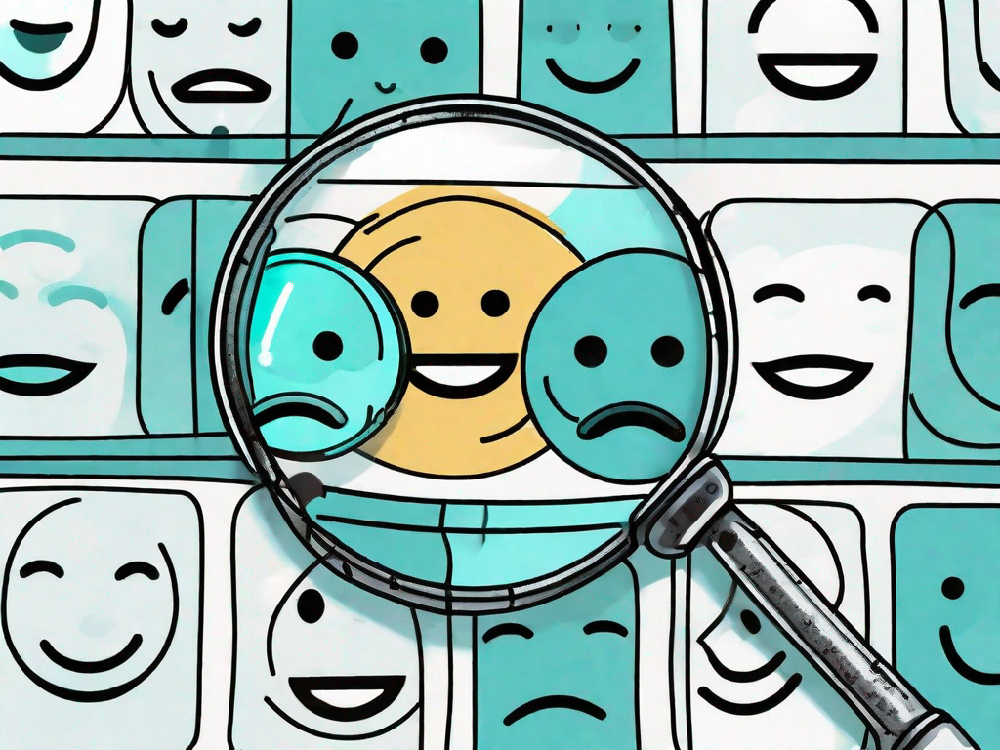

In [35]:
def polarity(x):
    if type(x) == str:
        return SIA.polarity_scores(x)
    else:
        return 1000

SIA = SentimentIntensityAnalyzer()
train_data["polarity"] = train_data["comment_text"].progress_apply(polarity)

100%|██████████| 239461/239461 [03:28<00:00, 1146.53it/s]


**Negative sentiment** refers to the expression of pessimistic, critical, or otherwise harmful emotions in a given text. It can manifest as anger, disgust, fear, or sadness, among other negative emotional states. In sentiment analysis, negative sentiment is quantified as a score between 0 and 1, where a score closer to 1 indicates stronger negativity, and a score near 0 reflects a lack of negative emotions.

In [36]:
fig = go.Figure(go.Histogram(x=[pols["neg"] for pols in train_data["polarity"] if pols["neg"] != 0], marker=dict(
            color='seagreen')
    ))

fig.update_layout(xaxis_title="Negativity sentiment", title_text="Negativity sentiment", template="simple_white")
fig.show()

From the plot above, we observe a strong rightward (positive) skew in the distribution of negative sentiment scores. This indicates that the majority of comments exhibit low levels of negativity, suggesting that toxic or highly negative comments are relatively rare within this dataset. The most frequent negativity score is approximately 0.04, which further supports the idea that most comments contain little to no negativity.

Furthermore, it is notable that almost no comments have a negativity score exceeding 0.8, highlighting the infrequency of extreme negative sentiment. This distribution reflects the overall nature of the dataset, where negative sentiment—and by extension, toxic comments—appears to be the exception rather than the rule.

In [37]:
# Ensure 'negativity' is extracted safely, handling errors for missing or malformed data
def extract_negativity(polarity):
    try:
        return polarity.get("neg", np.nan)  # Return 'neg' if it exists, otherwise NaN
    except AttributeError:
        return np.nan  # Return NaN if 'polarity' is not a dict-like object

# Apply the 'extract_negativity' function to safely extract 'negativity' values
train_data["negativity"] = train_data["polarity"].apply(extract_negativity)

# Drop rows with NaN in 'negativity' column
train_data_clean = train_data.dropna(subset=["negativity"])

# Group by 'lang' and calculate the mean 'negativity'
negativity_means = train_data_clean.groupby("lang")["negativity"].mean().tolist()

# Create DataFrame from 'lang_list' and the calculated negativity means
df = pd.DataFrame({
    "Language": lang_list,
    "Negativity": negativity_means
})

# Convert 'Negativity' to float and filter out rows where negativity is 0
df["Negativity"] = df["Negativity"].apply(float)
df = df.query("Negativity != 0")

# Apply the 'get_country' function to get country names from languages
df["country"] = df["Language"].apply(get_country)

# Filter out rows where 'country' is 'None'
df = df.query("country != 'None'")

# Create a choropleth map
fig = px.choropleth(
    df,
    locations="country",
    hover_name="country",
    projection="natural earth",
    locationmode="country names",
    title="Average negative sentiment vs. Country",
    color="Negativity",
    template="plotly",
    color_continuous_scale="greens"
)

# Show the plot
fig.show()


In the world plot, we observe that German has the highest average negativity score, with a value of 0.129. This suggests that comments in German tend to exhibit a greater degree of negative sentiment compared to other languages in the dataset. Additionally, languages from Western Europe, such as German, and those from Southeast Asia show a tendency toward higher average toxicity levels compared to languages like Hindi and Russian.

This geographical disparity in negativity scores may be influenced by various sociocultural factors, including differing norms for online communication and the unique linguistic structures that can influence sentiment analysis outcomes. For instance, languages with more nuanced expressions of negativity or disagreement might appear to exhibit higher toxicity levels based on the models used in the analysis of the data.

In [38]:
nums_1 = train_data.sample(frac=0.1).query("toxic == 1")["negativity"]
nums_2 = train_data.sample(frac=0.1).query("toxic == 0")["negativity"]

fig = ff.create_distplot(hist_data=[nums_1, nums_2],
                         group_labels=["Toxic", "Non-toxic"],
                         colors=["darkorange", "dodgerblue"], show_hist=False)

fig.update_layout(title_text="Negativity vs. Toxicity", xaxis_title="Negativity", template="simple_white")
fig.show()


The plotted distribution of negativity scores for both toxic and non-toxic comments reveals a clear and significant distinction in sentiment. Toxic comments, on average, exhibit much higher levels of negative sentiment compared to non-toxic ones. This difference is evident in the probability density functions: while the density for non-toxic comments peaks around a negativity score of 0, indicating that these comments rarely express negative emotions, the density for toxic comments is much lower at this point.

**Positive sentiment** refers to the expression of optimistic or uplifting emotions in a comment. It is measured on a scale ranging from 0 to 1, with higher scores indicating a greater degree of positivity. A score closer to 1 suggests that the comment conveys strongly positive or constructive emotions, while lower scores signify neutral or less positive sentiment. This metric is crucial for understanding how encouraging, supportive, or agreeable the language used in online interactions is, which can often serve as a counterbalance to toxicity.

In [39]:
fig = go.Figure(go.Histogram(x=[pols["pos"] for pols in train_data["polarity"] if pols["pos"] != 0], marker=dict(
            color='indianred')
    ))

fig.update_layout(xaxis_title="Positivity sentiment", title_text="Positivity sentiment", template="simple_white")
fig.show()

From the plot above, we observe that positive sentiment displays a strong rightward (positive) skew, indicating that explicit expressions of positivity are relatively uncommon in the dataset. Most comments exhibit only mild positivity, with the highest probability density occurring around a positivity value of 0.08. This suggests that while positivity is present, it is often subtle rather than overwhelming. Interestingly, very few comments have a positivity score greater than 0.8, highlighting that extreme positivity is rare in these online conversations.

This distribution aligns with the typical patterns seen in large-scale datasets where neutral or moderately emotional language tends to dominate over strongly positive or negative expressions.








In [40]:
# Ensure 'positivity' is extracted safely, handling errors for missing or malformed data
def extract_positivity(polarity):
    try:
        return polarity.get("pos", np.nan)  # Return 'pos' if it exists, otherwise NaN
    except AttributeError:
        return np.nan  # Return NaN if 'polarity' is not a dict-like object

# Apply the 'extract_positivity' function to safely extract 'positivity' values
train_data["positivity"] = train_data["polarity"].apply(extract_positivity)

# Drop rows with NaN in 'positivity' column
train_data_clean = train_data.dropna(subset=["positivity"])

# Group by 'lang' and calculate the mean 'positivity'
positivity_means = train_data_clean.groupby("lang")["positivity"].mean()

# Create DataFrame from 'lang_list' and the calculated positivity means
df = pd.DataFrame({
    "Language": positivity_means.index,  # Use the index from the groupby object
    "Positivity": positivity_means.values  # Use the values from the groupby object
})

# Convert 'Positivity' to float
df["Positivity"] = df["Positivity"].apply(float)

# Apply the 'get_country' function to get country names from languages
df["country"] = df["Language"].apply(get_country)

# Filter out rows where 'country' is 'None'
df = df.query("country != 'None'")

# Create a choropleth map
fig = px.choropleth(
    df,
    locations="country",
    hover_name="country",
    projection="natural earth",
    locationmode="country names",
    title="Average positive sentiment vs. Country",
    color="Positivity",
    template="plotly",
    color_continuous_scale="reds"
)

# Show the plot
fig.show()


In the world plot, we can observe that the languages with the highest average positivity scores include English, Spanish, Portuguese, and Danish. These languages tend to exhibit more positive sentiment in the comments, suggesting that conversations in these languages are generally more optimistic or constructive compared to others. This trend might reflect the nature of discussions in different cultural or linguistic contexts, where positive expressions and collaborative tones are more prevalent.

Interestingly, languages from these regions are often associated with higher levels of engagement in online platforms, which could explain the relatively higher positivity scores in this dataset.

In [41]:
nums_1 = train_data.sample(frac=0.1).query("toxic == 1")["positivity"]
nums_2 = train_data.sample(frac=0.1).query("toxic == 0")["positivity"]

fig = ff.create_distplot(hist_data=[nums_1, nums_2],
                         group_labels=["Toxic", "Non-toxic"],
                         colors=["darkorange", "dodgerblue"], show_hist=False)

fig.update_layout(title_text="Positivity vs. Toxicity", xaxis_title="Positivity", template="simple_white")
fig.show()

I have plotted the distribution of positivity for both toxic and non-toxic comments above. The analysis reveals that the distributions for these two categories are strikingly similar, suggesting that positivity alone is not a reliable indicator of toxicity in comments. This similarity implies that comments can exhibit a range of positivity scores regardless of their toxicity classification.

In essence, a comment can be both positive and toxic, indicating that individuals may express toxic sentiments even in seemingly upbeat or constructive language. This highlights the complexity of human communication, where underlying intentions and emotional expressions may not always align with the superficial positivity of the language used. Thus, relying solely on positivity metrics could lead to misclassifications when identifying toxic comments in online conversations.

### Neutrality Sentiment









**Neutrality sentiment** quantifies the level of bias or opinion expressed in a given text. This score ranges from 0 to 1, where a higher score indicates a greater degree of neutrality or lack of bias in the language used. A neutrality score close to 1 suggests that the text is factual and devoid of subjective opinions, while a score approaching 0 indicates the presence of strong opinions or biases.

In the context of analyzing online comments, understanding neutrality sentiment is crucial. Comments with high neutrality scores may reflect objective perspectives, while those with low scores could signify emotional reactions or personal biases. Thus, this metric provides valuable insights into the tone and intent behind the comments, contributing to a comprehensive understanding of the discourse within the dataset.


In [42]:
fig = go.Figure(go.Histogram(x=[pols["neu"] for pols in train_data["polarity"] if pols["neu"] != 1], marker=dict(
            color='dodgerblue')
    ))

fig.update_layout(xaxis_title="Neutrality sentiment", title_text="Neutrality sentiment", template="simple_white")
fig.show()

From the analysis presented in the plot above, it is evident that the distribution of neutrality sentiment exhibits a pronounced leftward (negative) skew. This contrasts sharply with the distributions of both negativity and positivity sentiments. The skewness in neutrality suggests that the majority of comments within the dataset are characterized by a high degree of neutrality and lack of bias.

This trend indicates that most comments do not express strong opinions or polarizing viewpoints, thereby reinforcing the notion that the dataset predominantly contains non-toxic comments. The predominance of neutral sentiments implies that, while toxic comments may exist, they represent a smaller fraction of the overall discourse. This insight is crucial for understanding the dynamics of online conversations, as it highlights the relative absence of extreme opinions in the dataset.


In [43]:
# Ensure 'neutrality' is extracted safely, handling errors for missing or malformed data
def extract_neutrality(polarity):
    try:
        return polarity.get("neu", np.nan)  # Return 'neu' if it exists, otherwise NaN
    except AttributeError:
        return np.nan  # Return NaN if 'polarity' is not a dict-like object

# Apply the 'extract_neutrality' function to safely extract 'neutrality' values
train_data["neutrality"] = train_data["polarity"].apply(extract_neutrality)

# Drop rows with NaN in 'neutrality' column
train_data_clean = train_data.dropna(subset=["neutrality"])

# Group by 'lang' and calculate the mean 'neutrality'
neutrality_means = train_data_clean.groupby("lang")["neutrality"].mean()

# Create DataFrame from 'lang_list' and the calculated neutrality means
df = pd.DataFrame({
    "Language": neutrality_means.index,  # Use the index from the groupby object
    "Neutrality": neutrality_means.values  # Use the values from the groupby object
})

# Convert 'Neutrality' to float
df["Neutrality"] = df["Neutrality"].apply(float)

# Apply the 'get_country' function to get country names from languages
df["country"] = df["Language"].apply(get_country)

# Filter out rows where 'country' is 'None' or 'Neutrality' is 1
df = df.query("country != 'None' and Neutrality != 1")

# Create a choropleth map
fig = px.choropleth(
    df,
    locations="country",
    hover_name="country",
    projection="natural earth",
    locationmode="country names",
    title="Average Neutral Sentiment vs. Country",
    color="Neutrality",
    template="plotly",
    color_continuous_scale="blues"
)

# Show the plot
fig.show()


In the analysis represented in the world plot, we observe that the languages exhibiting the highest levels of neutrality sentiment are Persian, Hindi, Russian, and South African languages, with an average neutrality score of 0.82. This indicates that comments in these languages tend to be more impartial and less opinionated, reflecting a greater tendency towards neutrality in discourse.

In [44]:
nums_1 = train_data.sample(frac=0.1).query("toxic == 1")["neutrality"]
nums_2 = train_data.sample(frac=0.1).query("toxic == 0")["neutrality"]

fig = ff.create_distplot(hist_data=[nums_1, nums_2],
                         group_labels=["Toxic", "Non-toxic"],
                         colors=["darkorange", "dodgerblue"], show_hist=False)

fig.update_layout(title_text="Neutrality vs. Toxicity", xaxis_title="Neutrality", template="simple_white")
fig.show()

The analysis indicates that non-toxic comments generally exhibit higher neutrality values compared to toxic comments. This is evident from the probability density distribution, where the non-toxic comments display a pronounced spike at a neutrality score of 1. In contrast, the probability density for toxic comments is significantly diminished at this same neutrality value.

This finding implies a strong correlation between high neutrality and non-toxicity in comments. Specifically, it suggests that comments with a neutrality score approaching 1 are much more likely to be categorized as non-toxic. The data underscores the potential of neutrality as a useful metric for identifying non-toxic discourse, highlighting its role in fostering constructive and respectful online interactions. This observation is particularly valuable for developing automated tools and algorithms aimed at detecting and filtering toxic comments in online platforms.

### Compound Sentiment

**Compound sentiment** is a comprehensive measure that quantifies the overall emotional tone of a given sentence or comment. This score ranges from -1 to 1, where values closer to 1 indicate a highly positive sentiment, reflecting strong positive emotions, while values nearing -1 signify a predominantly negative sentiment, indicating strong negative emotions. A score of 0 suggests a neutral sentiment, with no significant emotional charge.

By analyzing compound sentiment, we can gain insights into the emotional intensity and direction of comments, allowing for a deeper understanding of the underlying sentiments expressed in online discussions. This metric can be particularly useful in distinguishing between neutral, positive, and negative comments, thereby aiding in the identification of toxic behavior in digital communications.

In [45]:
fig = go.Figure(go.Histogram(x=[pols["compound"] for pols in train_data["polarity"] if pols["compound"] != 0], marker=dict(
            color='orchid')
    ))

fig.update_layout(xaxis_title="Compound sentiment", title_text="Compound sentiment", template="simple_white")
fig.show()


The distribution of compound sentiment, as illustrated above, exhibits a relatively uniform spread across the entire spectrum from -1 to 1, indicating that comments display a diverse range of emotional tones. This evenly distributed nature suggests that there is a significant variance in the emotional content of the comments analyzed.

The presence of random peaks throughout the range implies that certain comments express particularly strong emotions, whether positive or negative, leading to spikes in the compound sentiment scores. This variability highlights the complexity of online interactions, where users may express a wide array of sentiments in their comments.

In [46]:
# Function to safely extract 'compound' sentiment
def extract_compound(polarity):
    try:
        return polarity.get("compound", np.nan)  # Return 'compound' if it exists, otherwise NaN
    except AttributeError:
        return np.nan  # Return NaN if 'polarity' is not a dict-like object

# Apply the 'extract_compound' function to safely extract 'compound' values
train_data["compound"] = train_data["polarity"].apply(extract_compound)

# Drop rows with NaN in 'compound' column
train_data_clean = train_data.dropna(subset=["compound"])

# Group by 'lang' and calculate the mean 'compound'
compound_means = train_data_clean.groupby("lang")["compound"].mean()

# Create DataFrame from 'lang_list' and the calculated compound means
df = pd.DataFrame({
    "Language": compound_means.index,  # Use the index from the groupby object
    "Compound": compound_means.values  # Use the values from the groupby object
})

# Convert 'Compound' to float
df["Compound"] = df["Compound"].apply(float)

# Apply the 'get_country' function to get country names from languages
df["country"] = df["Language"].apply(get_country)

# Filter out rows where 'country' is 'None' or 'Compound' is 0
df = df.query("country != 'None' and Compound != 0")

# Create a choropleth map
fig = px.choropleth(
    df,
    locations="country",
    hover_name="country",
    projection="natural earth",
    locationmode="country names",
    title="Average Compound Sentiment vs. Country",
    color="Compound",
    template="plotly",
    color_continuous_scale="purples"
)

# Show the plot
fig.show()


In the world plot above, we can see that western European countries, south-east Asia, and Turkey have a lower average compound sentiment than most other countries. India, Russia, and Iran are among the countries with the maximum compound sentiment.

In [47]:
nums_1 = train_data.sample(frac=0.1).query("toxic == 1")["compound"]
nums_2 = train_data.sample(frac=0.1).query("toxic == 0")["compound"]

fig = ff.create_distplot(hist_data=[nums_1, nums_2],
                         group_labels=["Toxic", "Non-toxic"],
                         colors=["darkorange", "dodgerblue"], show_hist=False)

fig.update_layout(title_text="Compound vs. Toxicity", xaxis_title="Compound", template="simple_white")
fig.show()

The distribution of compound sentiment, as illustrated above, exhibits a relatively uniform spread across the entire spectrum from -1 to 1, indicating that comments display a diverse range of emotional tones. This evenly distributed nature suggests that there is a significant variance in the emotional content of the comments analyzed.

The presence of random peaks throughout the range implies that certain comments express particularly strong emotions, whether positive or negative, leading to spikes in the compound sentiment scores. This variability highlights the complexity of online interactions, where users may express a wide array of sentiments in their comments.

## Readability 


**Readability is a crucial aspect of written communication that reflects the ease with which a reader can comprehend a given text. Various metrics exist to quantify readability, including the Flesch Reading Ease, Automated Readability Index (ARI), and Dale-Chall Readability Formula. Each of these measures assesses different elements of text, such as sentence length, word length, and familiarity of vocabulary, to derive a readability score.**

**In this analysis, I will utilize the textstat library to evaluate the readability of comments within the dataset. By applying this library, I can calculate the aforementioned readability metrics, which will allow us to gauge how accessible the comments are to a broad audience.**

**The Flesch Reading Ease score provides insight into how easily a text can be understood, with higher scores indicating greater ease of reading. The ARI offers a numerical representation based on the average number of words per sentence and the average number of syllables per word. Meanwhile, the Dale-Chall formula emphasizes the familiarity of the words used, scoring texts based on the proportion of common versus uncommon words.**

**This multifaceted approach to measuring readability will enable us to identify patterns and trends within the comments, highlighting potential barriers to understanding and accessibility. Ultimately, this analysis aims to enhance our comprehension of the textual landscape within the dataset and contribute to the development of tools and strategies for improving online discourse.**


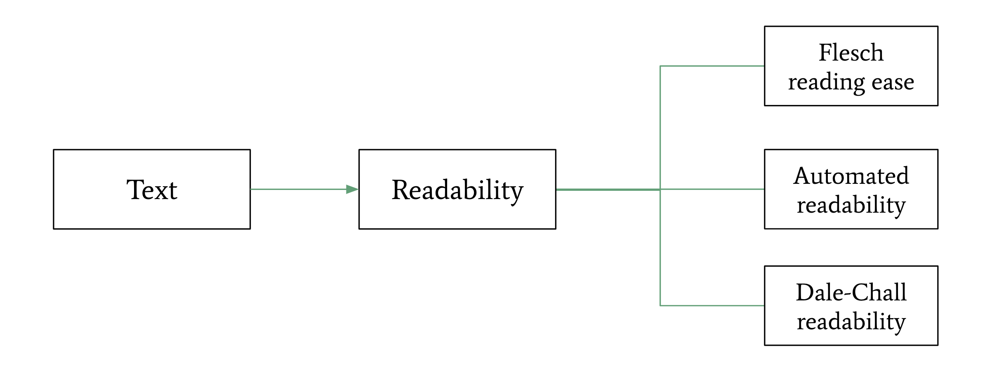






In [48]:
train_data["flesch_reading_ease"] = train_data["comment_text"].progress_apply(textstat.flesch_reading_ease)
train_data["automated_readability"] = train_data["comment_text"].progress_apply(textstat.automated_readability_index)
train_data["dale_chall_readability"] = train_data["comment_text"].progress_apply(textstat.dale_chall_readability_score)

100%|██████████| 239461/239461 [01:07<00:00, 3527.02it/s]


In [49]:
fig = go.Figure(go.Histogram(x=train_data.query("flesch_reading_ease > 0")["flesch_reading_ease"], marker=dict(
            color='darkorange')
    ))

fig.update_layout(xaxis_title="Flesch reading ease", title_text="Flesch reading ease", template="simple_white")
fig.show()

The distribution of the Flesch Reading Ease score exhibits a slight leftward (negative) skew, though it remains approximately normal. This indicates that while most comments are relatively easy to read, there is a small tendency for some texts to be slightly more challenging. The most frequent values of the Flesch Reading Ease score fall within the range of 66 to 66.5, which suggests that the majority of comments in the dataset are somewhat accessible and can be understood by individuals with a basic reading proficiency.

In [52]:
# Convert 'flesch_reading_ease' to numeric, coerce errors to NaN
train_data["flesch_reading_ease"] = pd.to_numeric(train_data["flesch_reading_ease"], errors='coerce')

# Drop rows with NaN in 'flesch_reading_ease'
train_data_clean = train_data.dropna(subset=["flesch_reading_ease"])

# Group by 'lang' and calculate the mean 'flesch_reading_ease'
flesch_means = train_data_clean.groupby("lang")["flesch_reading_ease"].mean()

# Create DataFrame from 'lang_list' and the calculated flesch means
df = pd.DataFrame({
    "Language": flesch_means.index,  # Use the index from the groupby object
    "flesch_reading_ease": flesch_means.values  # Use the values from the groupby object
})

# Convert 'flesch_reading_ease' to float
df["flesch_reading_ease"] = df["flesch_reading_ease"].apply(float)

# Filter for values greater than 0
df = df.query("flesch_reading_ease > 0")

# Apply the 'get_country' function to get country names from languages
df["country"] = df["Language"].apply(get_country)

# Filter out rows where 'country' is 'None'
df = df.query("country != 'None'")

# Create a choropleth map
fig = px.choropleth(
    df,
    locations="country",
    hover_name="country",
    projection="natural earth",
    locationmode="country names",
    title="Average Flesch Reading Ease vs. Country",
    color="flesch_reading_ease",
    template="plotly",
    color_continuous_scale="oranges"
)

# Show the plot
fig.show()


In the world plot above, we observe that the Flesch Reading Ease score reaches its peak in Vietnamese languages. These languages tend to have shorter sentences and fewer syllables per word, making them "easier" to read based on the Flesch metric. This suggests that texts in these languages are more accessible and may require less cognitive effort to comprehend.

Interestingly, South Africa registers a Flesch readability score of 69, which falls within the range of moderately easy to read. Meanwhile, Vietnam achieves the highest score of 98, signifying exceptionally high readability. The contrast between these countries points to varying linguistic structures and levels of complexity across regions. The readability of text can significantly influence how quickly and effectively individuals engage with content, and these variations provide valuable insights into the global diversity of language complexity within the dataset.

In [54]:
nums_1 = train_data.sample(frac=0.1).query("toxic == 1")["flesch_reading_ease"]
nums_2 = train_data.sample(frac=0.1).query("toxic == 0")["flesch_reading_ease"]

fig = ff.create_distplot(hist_data=[nums_1, nums_2],
                         group_labels=["Toxic", "Non-toxic"],
                         colors=["darkorange", "dodgerblue"], show_hist=False)

fig.update_layout(title_text="Flesch reading ease vs. Toxicity", xaxis_title="Flesch reading ease", template="simple_white")
fig.show()

The distribution of Flesch Reading Ease for both toxic and non-toxic comments, as plotted above, reveals a striking similarity between the two. This suggests that Flesch Reading Ease—a measure of how simple or difficult a text is to read—does not serve as a reliable indicator of comment toxicity. The fact that both toxic and non-toxic comments exhibit comparable readability levels indicates that the complexity of a sentence in terms of its structure or word choice does not necessarily correlate with its toxicity. In other words, a comment's toxicity seems to stem from factors beyond readability, such as its sentiment, context, or word choice, rather than how "easy" or "hard" it is to read.

In [55]:
fig = go.Figure(go.Histogram(x=train_data.query("automated_readability < 100")["automated_readability"], marker=dict(
            color='mediumaquamarine')
    ))

fig.update_layout(xaxis_title="Automated readability", title_text="Automated readability", template="simple_white")
fig.show()

The distribution of automated readability scores exhibits a slight rightward (positive) skew, though it maintains an overall normal distribution. This indicates that most comments fall within a moderate range of readability. The most common automated readability score in the dataset is approximately 9, which corresponds to a reading level typical for individuals around 14–15 years old. Notably, very few comments have a readability ease score greater than 60, suggesting that only a small portion of the comments are very easy to read. This trend indicates that the majority of comments in the dataset are moderately readable, with a focus on texts that require some level of comprehension.

In [56]:
# Convert 'automated_readability' to numeric, coerce errors to NaN
train_data["automated_readability"] = pd.to_numeric(train_data["automated_readability"], errors='coerce')

# Drop rows with NaN in 'automated_readability'
train_data_clean = train_data.dropna(subset=["automated_readability"])

# Group by 'lang' and calculate the mean 'automated_readability'
readability_means = train_data_clean.groupby("lang")["automated_readability"].mean()

# Create DataFrame from 'lang_list' and the calculated readability means
df = pd.DataFrame({
    "Language": readability_means.index,  # Use the index from the groupby object
    "automated_readability": readability_means.values  # Use the values from the groupby object
})

# Convert 'automated_readability' to float (though it should already be float from mean)
df["automated_readability"] = df["automated_readability"].apply(float)

# Filter for values less than 100
df = df.query("automated_readability < 100")

# Apply the 'get_country' function to get country names from languages
df["country"] = df["Language"].apply(get_country)

# Filter out rows where 'country' is 'None'
df = df.query("country != 'None'")

# Create a choropleth map
fig = px.choropleth(
    df,
    locations="country",
    hover_name="country",
    projection="natural earth",
    locationmode="country names",
    title="Automated Readability vs. Country",
    color="automated_readability",
    template="plotly",
    color_continuous_scale="GnBu"
)

# Show the plot
fig.show()


In the world plot above, we observe that Hindi, Arabic, and Somali comments exhibit the highest automated readability scores, indicating that these languages have texts that are easier to comprehend. In contrast, languages such as Turkish, English, and those from South-East Asia show relatively lower automated readability scores, suggesting that comments written in these languages may be more complex. South Africa records a score of 8.8, indicating a moderate readability level for its comments, slightly below the average for languages with higher automated readability.

In [57]:
nums_1 = train_data.sample(frac=0.1).query("toxic == 1")["automated_readability"]
nums_2 = train_data.sample(frac=0.1).query("toxic == 0")["automated_readability"]

fig = ff.create_distplot(hist_data=[nums_1, nums_2],
                         group_labels=["Toxic", "Non-toxic"],
                         colors=["darkorange", "dodgerblue"], show_hist=False)

fig.update_layout(title_text="Automated readability vs. Toxicity", xaxis_title="Automated readability", template="simple_white")
fig.show()

In the plot above, the distribution of automated readability for both toxic and non-toxic comments appears to be quite similar. This suggests that automated readability is not a reliable indicator of whether a comment is toxic or non-toxic. The similarity in distributions indicates that the complexity of language, as measured by this metric, does not strongly correlate with the presence of toxicity in comments. Therefore, readability alone cannot be used to accurately predict the toxicity of a given comment.

**Dale-Chall readability:**

The Dale–Chall readability formula is a readability test that provides a numeric gauge of the comprehension difficulty that readers come upon when reading a text. It uses a list of 3000 words that groups of fourth-grade American students could reliably understand, considering any word not on that list to be difficult. The Dale-Chall readability is calculated mathematically using the formula below:
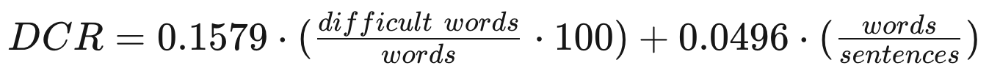

In [59]:
fig = go.Figure(go.Histogram(x=train_data.query("dale_chall_readability < 20")["dale_chall_readability"], marker=dict(
            color='deeppink')
    ))

fig.update_layout(xaxis_title="Dale-Chall readability", title_text="Dale-Chall readability", template="simple_white")
fig.show()

The Dale-Chall readability distribution exhibits a slight rightward (positive) skew, although the distribution still maintains a roughly normal shape. There are noticeable peaks to the left of the primary distribution, indicating some variability in readability. The most common value for Dale-Chall readability in the dataset is around 7, suggesting that the majority of comments fall within a range that is fairly accessible in terms of comprehension. Very few comments have a readability ease greater than 20, implying that most comments are not overly difficult to read, and that extreme readability values are rare in this dataset.

In [61]:
# Step 1: Ensure 'dale_chall_readability' is numeric, coercing errors to NaN
train_data["dale_chall_readability"] = pd.to_numeric(train_data["dale_chall_readability"], errors='coerce')

# Step 2: Drop rows where 'dale_chall_readability' is NaN
train_data_clean = train_data.dropna(subset=["dale_chall_readability"])

# Step 3: Group by 'lang' and compute mean of 'dale_chall_readability'
readability_means = train_data_clean.groupby("lang")["dale_chall_readability"].mean()

# Step 4: Create DataFrame with language and average dale_chall_readability
df = pd.DataFrame({
    "Language": readability_means.index,  # Use the index from the groupby object (languages)
    "dale_chall_readability": readability_means.values  # Use the values from the groupby object (readability scores)
})

# Step 5: Convert 'dale_chall_readability' to float if needed (it's already float after mean)
df["dale_chall_readability"] = df["dale_chall_readability"].apply(float)

# Step 6: Filter the DataFrame for values < 20
df = df.query("dale_chall_readability < 20")

# Step 7: Map 'Language' to 'Country' using the 'get_country' function
df["country"] = df["Language"].apply(get_country)

# Step 8: Filter out rows where 'country' is 'None'
df = df.query("country != 'None'")

# Step 9: Create a choropleth map
fig = px.choropleth(
    df,
    locations="country",
    hover_name="country",
    projection="natural earth",
    locationmode="country names",
    title="Dale-Chall Readability vs. Country",
    color="dale_chall_readability",
    template="plotly",
    color_continuous_scale="PuRd"
)

# Step 10: Show the plot
fig.show()


The Dale-Chall readability score appears to be highest in Middle-Eastern, South-East Asian, and South African languages, indicating that comments written in these languages may be easier to comprehend, with simpler vocabulary and sentence structure. In contrast, Arabic exhibit a lower Dale-Chall readability compared to most other languages in the dataset. This suggests that comments in these languages may be more challenging to read, possibly due to more complex linguistic patterns, a greater use of less common words, or longer sentences.

In [62]:
nums_1 = train_data.sample(frac=0.1).query("toxic == 1")["dale_chall_readability"]
nums_2 = train_data.sample(frac=0.1).query("toxic == 0")["dale_chall_readability"]

fig = ff.create_distplot(hist_data=[nums_1, nums_2],
                         group_labels=["Toxic", "Non-toxic"],
                         colors=["darkorange", "dodgerblue"], show_hist=False)

fig.update_layout(title_text="Dale-Chall readability vs. Toxicity", xaxis_title="Dale-Chall readability", template="simple_white")
fig.show()

The Dale-Chall readability score tends to be higher for non-toxic comments on average, suggesting that non-toxic comments often use more "sophisticated" or "complex" language. This implies that non-toxic comments may involve more nuanced or intellectual discourse, while toxic comments are typically more direct and blunt in nature. The non-toxic distribution peaks at a higher readability value, which further emphasizes this distinction, indicating that toxic comments tend to use simpler, more aggressive language with less subtlety.

## Target Varible

Lets analyze the target varible.

### Word Clouds of clean comments

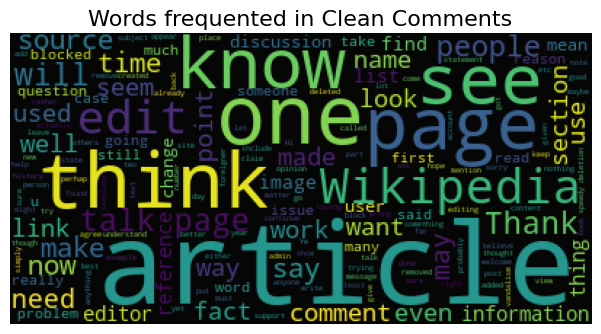

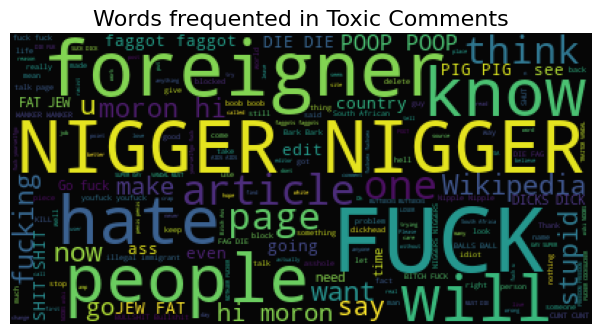

In [63]:

subset = train_data.query("toxic == 0")
text = subset.comment_text.values
wc = WordCloud(background_color="black",max_words=2000,stopwords=stopword)
wc.generate(" ".join(text))
plt.figure(figsize=(7.5, 7.5))
plt.axis("off")
plt.title("Words frequented in Clean Comments", fontsize=16)
plt.imshow(wc.recolor(colormap= 'viridis' , random_state=17), alpha=0.98)
plt.show()


subset = train_data.query("toxic == 1")
text = subset.comment_text.values
wc = WordCloud(background_color="black",max_words=2000,stopwords=stopword)
wc.generate(" ".join(text))
plt.figure(figsize=(7.5, 7.5))
plt.axis("off")
plt.title("Words frequented in Toxic Comments", fontsize=16)
plt.imshow(wc.recolor(colormap= 'viridis' , random_state=17), alpha=0.98)
plt.show()

The analysis of the word clouds reveals a stark contrast between toxic and non-toxic comments regarding language usage.

In the toxic comments word cloud, we can observe a pronounced prevalence of insulting or hateful language. Words such as "f**k," "foreigner," and the racial slur "nigger" prominently feature, highlighting the aggressive and derogatory nature of these comments. The frequent occurrence of such language underscores a pattern of hostility and intolerance, characteristic of toxic discourse. This use of offensive vocabulary not only reflects a lack of respect for others but also contributes to the perpetuation of harmful stereotypes and societal divides.

Conversely, the non-toxic comments word cloud lacks these hateful terms, suggesting a more constructive and respectful approach to communication. The absence of derogatory language indicates that non-toxic comments are characterized by a focus on dialogue and understanding, rather than hostility. This distinction underscores the importance of language in shaping online interactions and fostering a positive community.

Overall, the comparison of these word clouds serves to reinforce the significance of linguistic choices in online conversations. Toxic comments, marked by their use of insulting language, create an environment that can alienate individuals and inhibit productive discourse. In contrast, non-toxic comments promote a more inclusive and respectful atmosphere, emphasizing the potential for constructive engagement and collaboration.

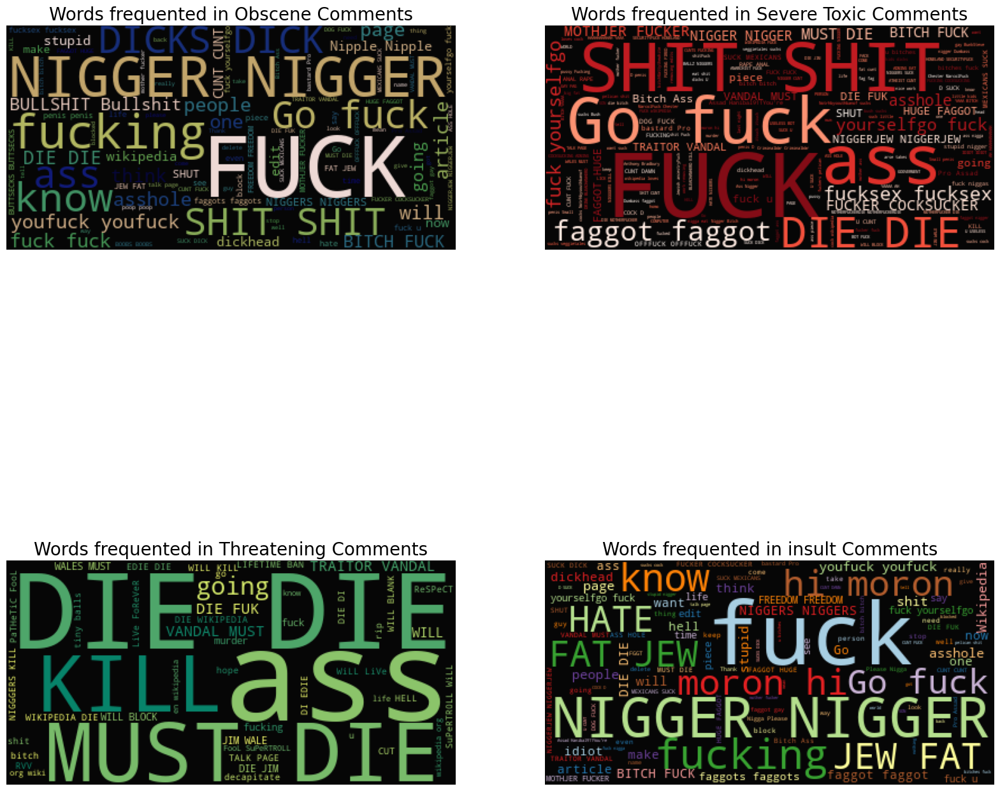

In [64]:

#wordcloud for clean comments
subset=train_data.query("obscene == 1")
text=subset.comment_text.values
wc= WordCloud(background_color="black",max_words=4000,stopwords=stopword)
wc.generate(" ".join(text))
plt.figure(figsize=(20,20))
plt.subplot(221)
plt.axis("off")
plt.title("Words frequented in Obscene Comments", fontsize=20)
plt.imshow(wc.recolor(colormap= 'gist_earth' , random_state=244), alpha=0.98)

#Severely toxic comments
plt.subplot(222)

subset=train_data[train_data.severe_toxic==1]
text=subset.comment_text.values
wc= WordCloud(background_color="black",max_words=2000,stopwords=stopword)
wc.generate(" ".join(text))
plt.axis("off")
plt.title("Words frequented in Severe Toxic Comments", fontsize=20)
plt.imshow(wc.recolor(colormap= 'Reds' , random_state=244), alpha=0.98)

#Threat comments
plt.subplot(223)
subset=train_data[train_data.threat==1]
text=subset.comment_text.values
wc= WordCloud(background_color="black",max_words=2000,stopwords=stopword)
wc.generate(" ".join(text))
plt.axis("off")
plt.title("Words frequented in Threatening Comments", fontsize=20)
plt.imshow(wc.recolor(colormap= 'summer' , random_state=2534), alpha=0.98)

#insult
plt.subplot(224)
subset=train_data[train_data.insult==1]
text=subset.comment_text.values
wc= WordCloud(background_color="black",max_words=2000,stopwords=stopword)
wc.generate(" ".join(text))
plt.axis("off")
plt.title("Words frequented in insult Comments", fontsize=20)
plt.imshow(wc.recolor(colormap= 'Paired_r' , random_state=244), alpha=0.98)

plt.show()

In the word clouds, we observe that most categories of toxic comments—such as insults, obscenities, and identity hate—exhibit a reliance on insulting or hateful language. These comments often employ derogatory terms that aim to demean or dehumanize individuals or groups. This linguistic choice reflects an environment steeped in negativity and hostility, which can significantly impact the well-being of those targeted.

However, the threat category presents a more alarming trend. It features specific words such as "kill" and "die," which convey a more direct and explicit form of aggression. This linguistic pattern indicates that threats are not merely insults; they imply a willingness to cause harm, showcasing a serious level of hostility. This is particularly concerning, as it reveals the potential for escalation from verbal threats to real-world violence.

Furthermore, this trend aligns with the context of xenophobic comments often found in the South African dataset. The historical and socio-political landscape of South Africa has seen instances where xenophobia manifests through verbal threats, reflecting deep-seated tensions between various communities. The presence of threatening language in this dataset underscores the importance of addressing not only the language of insult but also the underlying issues that give rise to such sentiments.

In [65]:
fig = go.Figure(data=[
    go.Pie(labels=train_data.columns[2:7],
           values=train_data.iloc[:, 2:7].sum().values, marker=dict(colors=px.colors.qualitative.Plotly))
])
fig.update_traces(textposition='outside', textfont=dict(color="black"))
fig.update_layout(title_text="Pie chart of labels")
fig.show()

The pie chart provides a clear visual representation of the distribution of toxic comment targets within the dataset. It highlights that the most prevalent target for toxicity is the category labeled as "toxic." This dominance indicates that a significant portion of the comments in this dataset exhibits behaviors characterized as toxic, which can include a range of negative interactions such as personal attacks, harassment, and disparaging remarks.

In contrast, the other targets, such as insult and threat, are relatively uncommon. This suggests that while toxic comments are widespread, not all negative interactions escalate to the level of direct insults or explicit threats. The lower prevalence of these categories might reflect the varied nature of online interactions, where some individuals may express their discontent or frustration through toxic comments without resorting to outright insults or threats.

This analysis underscores the need to address toxic behavior in online conversations, as it is the most common form of negativity identified. However, the relative rarity of insults and threats also indicates a potential for more constructive dialogue, as not all comments are harmful. Understanding this distribution can aid in developing targeted interventions to foster a more positive and respectful online environment.

In [66]:
fig = go.Figure(data=[
    go.Bar(y=train_data.columns[2:7],
           x=train_data.iloc[:, 2:7].sum().values, marker=dict(color=px.colors.qualitative.Plotly))
])

fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.75
fig.update_traces(orientation="h")
fig.update_layout(title_text="Bar chart of labels", template="plotly_white")
fig.show()

This plot shows the distribution of hatespeech.

In [67]:
# Step 1: Ensure 'toxic' column is numeric, coercing errors to NaN
train_data["toxic"] = pd.to_numeric(train_data["toxic"], errors='coerce')

# Step 2: Drop rows where 'toxic' is NaN
train_data_clean = train_data.dropna(subset=["toxic"])

# Step 3: Group by 'lang' and compute the mean of 'toxic'
toxicity_means = train_data_clean.groupby("lang")["toxic"].mean()

# Step 4: Create DataFrame with language and average toxicity
df = pd.DataFrame({
    "Language": toxicity_means.index,  # Use the index from the groupby object (languages)
    "toxicity": toxicity_means.values  # Use the values from the groupby object (toxicity scores)
})

# Step 5: Convert 'toxicity' to float if needed
df["toxicity"] = df["toxicity"].apply(float)

# Step 6: Map 'Language' to 'Country' using the 'get_country' function
df["country"] = df["Language"].apply(get_country)

# Step 7: Filter out rows where 'country' is 'None'
df = df.query("country != 'None'")

# Step 8: Create a choropleth map
fig = px.choropleth(
    df, 
    locations="country", 
    hover_name="country",
    projection="natural earth", 
    locationmode="country names", 
    title="Average Toxicity vs. Country", 
    color="toxicity",
    template="plotly", 
    color_continuous_scale="tealrose"
)

# Step 9: Show the plot
fig.show()


The world plot illustrates a striking contrast in average toxicity levels across different countries, with Ireland and South Africa emerging as the nations exhibiting the highest average toxicity in their online comments. This finding may indicate cultural, social, or contextual factors that contribute to more pronounced expressions of toxicity within these regions.

# Models

## Data Preprocessing and Model SetUp

In [69]:
val = val_data
train = train_data

def clean(text):
    text = text.fillna("fillna").str.lower()
    text = text.map(lambda x: re.sub('\\n',' ',str(x)))
    text = text.map(lambda x: re.sub("\[\[User.*",'',str(x)))
    text = text.map(lambda x: re.sub("\d{1,3}\.\d{1,3}\.\d{1,3}\.\d{1,3}",'',str(x)))
    text = text.map(lambda x: re.sub("\(http://.*?\s\(http://.*\)",'',str(x)))
    return text

val["comment_text"] = clean(val["comment_text"])
test_data["content"] = clean(test_data["content"])
train["comment_text"] = clean(train["comment_text"])

Clean the val data

In [70]:
class RocAucEvaluation(Callback):
    def __init__(self, validation_data=(), interval=1):
        super(Callback, self).__init__()

        self.interval = interval
        self.X_val, self.y_val = validation_data

    def on_epoch_end(self, epoch, logs={}):
        if epoch % self.interval == 0:
            y_pred = self.model.predict(self.X_val, verbose=0)
            score = roc_auc_score(self.y_val, y_pred)
            print("\n ROC-AUC - epoch: {:d} - score: {:.6f}".format(epoch+1, score))

In [71]:
def fast_encode(texts, tokenizer, chunk_size=240, maxlen=512):
    tokenizer.enable_truncation(max_length=maxlen)
    tokenizer.enable_padding(max_length=maxlen)
    all_ids = []
    
    for i in range(0, len(texts), chunk_size):
        text_chunk = texts[i:i+chunk_size].tolist()
        encs = tokenizer.encode_batch(text_chunk)
        all_ids.extend([enc.ids for enc in encs])
    
    return np.array(all_ids)

In [72]:
!ls /kaggle/input/


comment-classification-with-twit-and-jigsaw-data  south-african-twit-data-test
preparing-data-in-colab				  transformed-sa-data-train
sa-twitter-hate-dataset


These are the datasets we prepared and used.

In [73]:
import torch
if torch.cuda.is_available():
    print("CUDA is available. Using GPU.")
else:
    print("CUDA is not available. Using CPU.")


CUDA is available. Using GPU.


In [74]:
tokenizer = transformers.DistilBertTokenizer.from_pretrained('distilbert-base-multilingual-cased')

save_path = '/kaggle/working/distilbert_base_uncased/'
if not os.path.exists(save_path):
    os.makedirs(save_path)
tokenizer.save_pretrained(save_path)

fast_tokenizer = BertWordPieceTokenizer('distilbert_base_uncased/vocab.txt', 
                                        lowercase=True)

tokenizer_config.json:   0%|          | 0.00/49.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/996k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.96M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/466 [00:00<?, ?B/s]

In [75]:
def fast_encode(texts, tokenizer, chunk_size=240, maxlen=512):
    tokenizer.enable_truncation(max_length=maxlen)
    tokenizer.enable_padding()  # No arguments for padding
    all_ids = []

    for i in range(0, len(texts), chunk_size):
        text_chunk = texts[i:i+chunk_size].tolist()
        encs = tokenizer.encode_batch(text_chunk)
        all_ids.extend([enc.ids for enc in encs])

    # Padding sequences to ensure consistent length
    all_ids_padded = tf.keras.preprocessing.sequence.pad_sequences(all_ids, maxlen=maxlen, padding='post')

    return np.array(all_ids_padded)

# Encoding train, validation, and test data
x_train = fast_encode(train.comment_text.astype(str), fast_tokenizer, maxlen=512)
x_valid = fast_encode(val_data.comment_text.astype(str).values, fast_tokenizer, maxlen=512)
x_test = fast_encode(test_data.content.astype(str).values, fast_tokenizer, maxlen=512)

# Labels for validation and training sets
y_valid = val.toxic.values
y_train = train.toxic.values


In [76]:
# Define BATCH_SIZE
BATCH_SIZE = 32  # or any appropriate value here I used the Data Science industry standard

# Define AUTOTUNE for performance
AUTO = tf.data.experimental.AUTOTUNE

# Prepare train, validation, and test datasets
train_dataset = (
    tf.data.Dataset
    .from_tensor_slices((x_train, y_train))
    .repeat()
    .shuffle(2048)
    .batch(BATCH_SIZE)
    .prefetch(AUTO)
)

valid_dataset = (
    tf.data.Dataset
    .from_tensor_slices((x_valid, y_valid))
    .batch(BATCH_SIZE)
    .prefetch(AUTO)
)

test_dataset = (
    tf.data.Dataset
    .from_tensor_slices(x_test)
    .batch(BATCH_SIZE)
)


In [78]:
# Define the strategy for GPU/CPU
strategy = tf.distribute.MirroredStrategy()

print(f"Number of devices: {strategy.num_replicas_in_sync}")


Number of devices: 2


In [84]:
from tensorflow.keras import layers

In [98]:
import keras.backend as K
import tensorflow as tf
from transformers import TFDistilBertModel
from tensorflow.keras.layers import Input, Embedding, Conv1D, GlobalAveragePooling1D, Dense, SpatialDropout1D, concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from transformers import TFAutoModel


In [99]:
# Initialize transformer layer
transformer_layer = TFAutoModel.from_pretrained('bert-base-uncased')


config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.predictions.transform.dense.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.bias']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions w

## CNN Model

In [87]:
!pip install tensorflow transformers


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


In [101]:
def build_cnn_model(transformer, max_len):
    input_word_ids = Input(shape=(max_len,), dtype=tf.int32, name="input_word_ids")
    
    embed = transformer.weights[0].numpy()
    embedding = Embedding(np.shape(embed)[0], np.shape(embed)[1],
                          input_length=max_len, weights=[embed],
                          trainable=False)(input_word_ids)
    
    embedding = SpatialDropout1D(0.3)(embedding)
    conv_1 = Conv1D(64, 2)(embedding)
    conv_2 = Conv1D(64, 3)(embedding)
    conv_3 = Conv1D(64, 4)(embedding)
    conv_4 = Conv1D(64, 5)(embedding)
    
    maxpool_1 = GlobalAveragePooling1D()(conv_1)
    maxpool_2 = GlobalAveragePooling1D()(conv_2)
    maxpool_3 = GlobalAveragePooling1D()(conv_3)
    maxpool_4 = GlobalAveragePooling1D()(conv_4)
    conc = concatenate([maxpool_1, maxpool_2, maxpool_3, maxpool_4], axis=1)

    conc = Dense(64, activation='relu')(conc)
    conc = Dense(1, activation='sigmoid')(conc)
    
    model = Model(inputs=input_word_ids, outputs=conc)
    
    model.compile(Adam(learning_rate=1.5e-5), 
              loss='binary_crossentropy', 
              metrics=['accuracy'])

    
    return model

In [102]:
with strategy.scope():
    model_cnn = build_cnn_model(transformer_layer, max_len=512)

model_cnn.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_word_ids      │ (None, 512)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding           │ (None, 512, 768)  │ 23,440,896 │ input_word_ids[0… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ spatial_dropout1d   │ (None, 512, 768)  │          0 │ embedding[0][0]   │
│ (SpatialDropout1D)  │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d (Conv1D)     │ (None, 511, 64)   │     98,368 │ spatial_dropout1… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1 (Conv1D)   │ (None, 510, 64)   │    147,520 │ spatial_dropout1… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_2 (Conv1D)   │ (None, 509, 64)   │    196,672 │ spatial_dropout1… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_3 (Conv1D)   │ (None, 508, 64)   │    245,824 │ spatial_dropout1… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 64)        │          0 │ conv1d[0][0]      │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 64)        │          0 │ conv1d_1[0][0]    │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 64)        │          0 │ conv1d_2[0][0]    │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 64)        │          0 │ conv1d_3[0][0]    │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 256)       │          0 │ global_average_p… │
│ (Concatenate)       │                   │            │ global_average_p… │
│                     │                   │            │ global_average_p… │
│                     │                   │            │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 64)        │     16,448 │ concatenate[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 1)         │         65 │ dense[0][0]       │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 24,145,793 (92.11 MB)

 Trainable params: 704,897 (2.69 MB)

 Non-trainable params: 23,440,896 (89.42 MB)

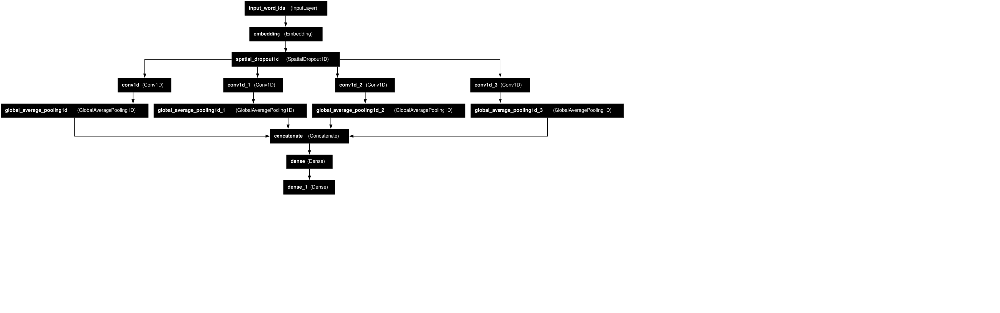

In [103]:
SVG(tf.keras.utils.model_to_dot(model_cnn, dpi=45).create(prog='dot', format='svg'))

In [105]:
def callback():
    cb = []

    reduceLROnPlat = ReduceLROnPlateau(monitor='val_loss',  
                                    factor=0.3, patience=3, 
                                    verbose=1, mode='auto', 
                                    epsilon=0.0001, cooldown=1, min_lr=0.000001)
    cb.append(reduceLROnPlat)
    log = CSVLogger('log.csv')
    cb.append(log)

    RocAuc = RocAucEvaluation(validation_data=(x_valid, y_valid), interval=1)
    cb.append(RocAuc)
    
    return cb

In [108]:
N_STEPS = x_train.shape[0] // BATCH_SIZE
calls = callback()
EPOCHS=2

In [109]:
train_history = model_cnn.fit(
    train_dataset,
    steps_per_epoch=N_STEPS,
    validation_data=valid_dataset,
    callbacks = calls,
    epochs=EPOCHS
)

Epoch 1/2
7482/7483 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9020 - loss: 0.3294
 ROC-AUC - epoch: 1 - score: 0.538543
7483/7483 ━━━━━━━━━━━━━━━━━━━━ 152s 19ms/step - accuracy: 0.9020 - loss: 0.3294 - val_accuracy: 0.8425 - val_loss: 0.4446 - learning_rate: 1.5000e-05
Epoch 2/2
7483/7483 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.8989 - loss: 0.3224
 ROC-AUC - epoch: 2 - score: 0.537892
7483/7483 ━━━━━━━━━━━━━━━━━━━━ 141s 19ms/step - accuracy: 0.8989 - loss: 0.3224 - val_accuracy: 0.8425 - val_loss: 0.4405 - learning_rate: 1.5000e-05


In [111]:
pip install deep-translator


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.3/42.3 kB 1.9 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [112]:
from deep_translator import GoogleTranslator

def visualize_model_preds(model, indices=[0, 17, 1, 24]):
    comments = val_data.comment_text.loc[indices].values.tolist()
    preds = model.predict(x_valid[indices].reshape(len(indices), -1))

    for idx, i in enumerate(indices):
        if y_valid[i] == 0:
            label = "Non-toxic"
            color = f'{Fore.GREEN}'
            symbol = '\u2714'
        else:
            label = "Toxic"
            color = f'{Fore.RED}'
            symbol = '\u2716'

        print('{}{} {}'.format(color, str(idx+1) + ". " + label, symbol))
        print(f'{Style.RESET_ALL}')
        print("ORIGINAL")
        print(comments[idx]); print("")
        print("TRANSLATED")

        # Using deep-translator for translation
        translated_text = GoogleTranslator(source='auto', target='en').translate(comments[idx])
        print(translated_text)

        

visualize_model_preds(model_cnn)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step
1. Non-toxic ✔

ORIGINAL
este usuario ni siquiera llega al rango de    hereje   . por lo tanto debería ser quemado en la barbacoa para purificar su alma y nuestro aparato digestivo mediante su ingestión.    skipe linkin 22px   honor, valor, leltad.      17:48 13 mar 2008 (utc)

TRANSLATED
This user does not even reach the rank of heretic. Therefore, he should be burned on the barbecue to purify his soul and our digestive system by ingesting him. skipe linkin 22px honor, valor, loyalty. 17:48 13 mar 2008 (utc)
2. Toxic ✖

ORIGINAL
in riguardo a cio  che ho pubblicato e tu hai già tolto dai maroni. lo trovo ingiusto e un po  comunista. sei pregato di non scassarmi il cazzo, e te lo chiedo gentilemnte. 

TRANSLATED
regarding what i posted and you already took off your balls. i find it unfair and a bit communist. please don't bother me, and i ask you kindly.
3. Non-toxic ✔

ORIGINAL
il testo di questa voce pare esser scopiazzato direttamente da qui. i

## LSTM with Attention

In [113]:
import tensorflow as tf
from tensorflow.keras.layers import Layer
from tensorflow.keras import initializers
from tensorflow.keras import InputSpec

### Attention Layer

In [114]:
class AttentionWeightedAverage(Layer):
    def __init__(self, return_attention=False, **kwargs):
        self.init = initializers.get('uniform')
        self.supports_masking = True
        self.return_attention = return_attention
        super(AttentionWeightedAverage, self).__init__(**kwargs)

    def build(self, input_shape):
        self.input_spec = [InputSpec(ndim=3)]
        assert len(input_shape) == 3

        self.W = self.add_weight(shape=(input_shape[2], 1),
                                 name='{}_W'.format(self.name),
                                 initializer=self.init)
        super(AttentionWeightedAverage, self).build(input_shape)

    def call(self, x, mask=None):
        # Use tf.matmul instead of K.dot
        logits = tf.matmul(x, self.W)  # Change to tf.matmul
        x_shape = tf.shape(x)
        logits = tf.reshape(logits, (x_shape[0], x_shape[1]))
        ai = tf.exp(logits - tf.reduce_max(logits, axis=-1, keepdims=True))

        if mask is not None:
            mask = tf.cast(mask, tf.float32)
            ai = ai * mask

        att_weights = ai / (tf.reduce_sum(ai, axis=1, keepdims=True) + tf.keras.backend.epsilon())
        weighted_input = x * tf.expand_dims(att_weights, axis=-1)  # Expand dimensions for broadcasting
        result = tf.reduce_sum(weighted_input, axis=1)

        if self.return_attention:
            return [result, att_weights]
        return result

    def compute_output_shape(self, input_shape):
        output_len = input_shape[2]
        if self.return_attention:
            return [(input_shape[0], output_len), (input_shape[0], input_shape[1])]
        return (input_shape[0], output_len)

    def compute_mask(self, inputs, mask=None):
        if isinstance(mask, list):
            return [None] * len(mask)
        return None


In [116]:
from tensorflow.keras.layers import Input, Embedding, SpatialDropout1D, LSTM, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

In [117]:
def build_lstm_model(transformer, max_len):
    # Define input layer
    input_word_ids = Input(shape=(max_len,), dtype=tf.int32, name="input_word_ids")
    
    # Load embedding weights from transformer
    embed = transformer.weights[0].numpy()
    embedding = Embedding(input_dim=np.shape(embed)[0], 
                          output_dim=np.shape(embed)[1],
                          input_length=max_len, 
                          weights=[embed],
                          trainable=False)(input_word_ids)
    
    # Apply Spatial Dropout
    embedding = SpatialDropout1D(0.3)(embedding)
    
    # Define LSTM layers
    lstm_1 = LSTM(128, return_sequences=True)(embedding)
    lstm_2 = LSTM(128, return_sequences=True)(lstm_1)
    
    # Attention layer
    attention = AttentionWeightedAverage()(lstm_2)
    
    # Fully connected layers
    conc = Dense(64, activation='relu')(attention)
    output = Dense(1, activation='sigmoid')(conc)  # Output layer for binary classification
    
    # Create the model
    model = Model(inputs=input_word_ids, outputs=output)
    
    # Compile the model with a learning rate and optimizer
    model.compile(optimizer=Adam(learning_rate=0.01), 
                  loss='binary_crossentropy', 
                  metrics=['accuracy'])
    
    return model


In [118]:
with strategy.scope():
    model_lstm = build_lstm_model(transformer_layer, max_len=512)

model_lstm.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_word_ids (InputLayer)     │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ embedding_1 (Embedding)         │ (None, 512, 768)       │    23,440,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ spatial_dropout1d_1             │ (None, 512, 768)       │             0 │
│ (SpatialDropout1D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 512, 128)       │       459,264 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 512, 128)       │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ attention_weighted_average      │ (None, 128)            │           128 │
│ (AttentionWeightedAverage)      │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,040,193 (91.71 MB)

 Trainable params: 599,297 (2.29 MB)

 Non-trainable params: 23,440,896 (89.42 MB)

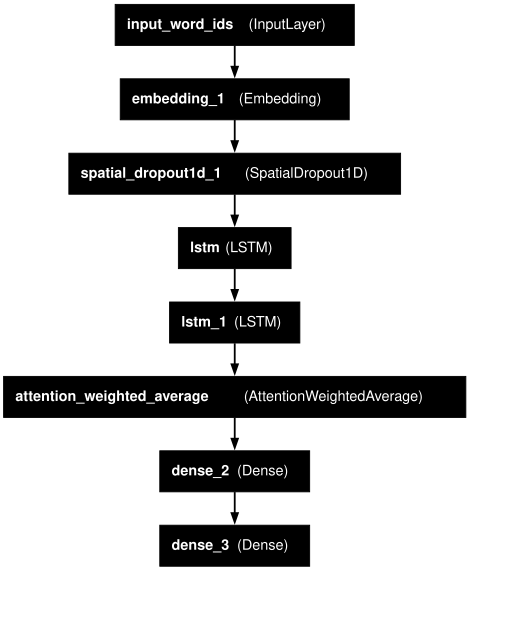

In [119]:
SVG(tf.keras.utils.model_to_dot(model_lstm, dpi=65).create(prog='dot', format='svg'))

In [120]:
train_history = model_lstm.fit(
    train_dataset,
    steps_per_epoch=N_STEPS,
    validation_data=valid_dataset,
    callbacks = calls,
    epochs=EPOCHS
)

Epoch 1/2
7483/7483 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - accuracy: 0.9018 - loss: 0.3233
 ROC-AUC - epoch: 1 - score: 0.492795
7483/7483 ━━━━━━━━━━━━━━━━━━━━ 379s 50ms/step - accuracy: 0.9018 - loss: 0.3233 - val_accuracy: 0.8425 - val_loss: 0.4699 - learning_rate: 0.0100
Epoch 2/2
7482/7483 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - accuracy: 0.8987 - loss: 0.3277
 ROC-AUC - epoch: 2 - score: 0.507205
7483/7483 ━━━━━━━━━━━━━━━━━━━━ 368s 49ms/step - accuracy: 0.8987 - loss: 0.3277 - val_accuracy: 0.8425 - val_loss: 0.4771 - learning_rate: 0.0100


In [121]:
visualize_model_preds(model_lstm)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 553ms/step
1. Non-toxic ✔

ORIGINAL
este usuario ni siquiera llega al rango de    hereje   . por lo tanto debería ser quemado en la barbacoa para purificar su alma y nuestro aparato digestivo mediante su ingestión.    skipe linkin 22px   honor, valor, leltad.      17:48 13 mar 2008 (utc)

TRANSLATED
This user does not even reach the rank of heretic. Therefore, he should be burned on the barbecue to purify his soul and our digestive system by ingesting him. skipe linkin 22px honor, valor, loyalty. 17:48 13 mar 2008 (utc)
2. Toxic ✖

ORIGINAL
in riguardo a cio  che ho pubblicato e tu hai già tolto dai maroni. lo trovo ingiusto e un po  comunista. sei pregato di non scassarmi il cazzo, e te lo chiedo gentilemnte. 

TRANSLATED
regarding what i posted and you already took off your balls. i find it unfair and a bit communist. please don't bother me, and i ask you kindly.
3. Non-toxic ✔

ORIGINAL
il testo di questa voce pare esser scopiazzato direttamente da qui. i

## Capsaule Network

In [129]:
def squash(x, axis=-1):
    s_squared_norm = K.sum(K.square(x), axis, keepdims=True) + K.epsilon()
    scale = K.sqrt(s_squared_norm) / (0.5 + s_squared_norm)
    return scale * x

class Capsule(Layer):

    def __init__(self,
                 num_capsule,
                 dim_capsule,
                 routings=3,
                 share_weights=True,
                 initializer='glorot_uniform',
                 activation='default',  # Changed to default for better clarity
                 regularizer=None,
                 constraint=None,
                 **kwargs):
        super(Capsule, self).__init__(**kwargs)
        self.num_capsule = num_capsule
        self.dim_capsule = dim_capsule
        self.routings = routings
        self.share_weights = share_weights

        self.activation = activations.get(activation)
        self.regularizer = regularizers.get(regularizer)
        self.initializer = initializers.get(initializer)
        self.constraint = constraints.get(constraint)

    def build(self, input_shape):
        input_dim_capsule = input_shape[-1]
        if self.share_weights:
            self.W = self.add_weight(name='capsule_kernel',
                                     shape=(1, input_dim_capsule, self.num_capsule * self.dim_capsule),
                                     initializer=self.initializer,
                                     regularizer=self.regularizer,
                                     constraint=self.constraint,
                                     trainable=True)
        else:
            input_num_capsule = input_shape[-2]
            self.W = self.add_weight(name='capsule_kernel',
                                     shape=(input_num_capsule, input_dim_capsule, self.num_capsule * self.dim_capsule),
                                     initializer=self.initializer,
                                     regularizer=self.regularizer,
                                     constraint=self.constraint,
                                     trainable=True)

    def call(self, inputs):
        if self.share_weights:
            u_hat_vectors = K.conv1d(inputs, self.W)
        else:
            u_hat_vectors = K.local_conv1d(inputs, self.W, [1], [1])

        batch_size = K.shape(inputs)[0]
        input_num_capsule = K.shape(inputs)[1]
        u_hat_vectors = K.reshape(u_hat_vectors, (batch_size, input_num_capsule, self.num_capsule, self.dim_capsule))

        u_hat_vectors = K.permute_dimensions(u_hat_vectors, (0, 2, 1, 3))
        routing_weights = K.zeros_like(u_hat_vectors[:, :, :, 0])

        for i in range(self.routings):
            capsule_weights = K.softmax(routing_weights, axis=1)
            outputs = K.batch_dot(capsule_weights, u_hat_vectors, [2, 2])
            if K.ndim(outputs) == 4:
                outputs = K.sum(outputs, axis=1)
            if i < self.routings - 1:
                outputs = K.l2_normalize(outputs, axis=-1)
                routing_weights = K.batch_dot(outputs, u_hat_vectors, [2, 3])
                if K.ndim(routing_weights) == 4:
                    routing_weights = K.sum(routing_weights, axis=1)

        return self.activation(outputs)

    def compute_output_shape(self, input_shape):
        return (None, self.num_capsule, self.dim_capsule)


In [139]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Embedding, SpatialDropout1D, Flatten, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

def build_capsule_model(transformer, max_len):
    input_word_ids = Input(shape=(max_len,), dtype=tf.int32, name="input_word_ids")
    
    # Extract embedding weights from the transformer
    embed = transformer.weights[0].numpy()
    
    # Create the embedding layer
    embedding = Embedding(input_dim=np.shape(embed)[0],
                          output_dim=np.shape(embed)[1],
                          input_length=max_len,
                          weights=[embed],
                          trainable=False)(input_word_ids)
    
    # Apply spatial dropout to the embeddings
    embedding = SpatialDropout1D(0.3)(embedding)
    
    # Add the Capsule layer
    capsule = Capsule(num_capsule=5, dim_capsule=5,
                      routings=4, activation=squash)(embedding)

    # Flatten the capsule output
    capsule = Flatten()(capsule)

    # Add dense layers for classification
    output = Dense(128, activation='relu')(capsule)
    output = Dense(1, activation='sigmoid')(output)
    
    # Create the model
    model = Model(inputs=input_word_ids, outputs=output)
    
    # Compile the model with an updated learning rate argument
    model.compile(optimizer=Adam(learning_rate=1.5e-5), 
                  loss='binary_crossentropy', 
                  metrics=['accuracy'])
    
    return model


In [131]:
with strategy.scope():
    model_capsule = build_capsule_model(transformer_layer, max_len=512)

model_capsule.summary()

Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_word_ids (InputLayer)     │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ embedding_4 (Embedding)         │ (None, 512, 768)       │    23,440,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ spatial_dropout1d_4             │ (None, 512, 768)       │             0 │
│ (SpatialDropout1D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ capsule_2 (Capsule)             │ (None, 5, 5)           │        19,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 25)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 128)            │         3,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,463,553 (89.51 MB)

 Trainable params: 22,657 (88.50 KB)

 Non-trainable params: 23,440,896 (89.42 MB)

In [135]:
import keras.backend as K
from tensorflow.keras.layers import Conv1D

class Capsule(Layer):

    def __init__(self,
                 num_capsule,
                 dim_capsule,
                 routings=3,
                 share_weights=True,
                 initializer='glorot_uniform',
                 activation='default', 
                 regularizer=None,
                 constraint=None,
                 **kwargs):
        super(Capsule, self).__init__(**kwargs)
        self.num_capsule = num_capsule
        self.dim_capsule = dim_capsule
        self.routings = routings
        self.share_weights = share_weights

        self.activation = activations.get(activation)
        self.regularizer = regularizers.get(regularizer)
        self.initializer = initializers.get(initializer)
        self.constraint = constraints.get(constraint)

    def build(self, input_shape):
        input_dim_capsule = input_shape[-1]
        if self.share_weights:
            self.W = self.add_weight(name='capsule_kernel',
                                     shape=(1, input_dim_capsule, self.num_capsule * self.dim_capsule),
                                     initializer=self.initializer,
                                     regularizer=self.regularizer,
                                     constraint=self.constraint,
                                     trainable=True)
        else:
            input_num_capsule = input_shape[-2]
            self.W = self.add_weight(name='capsule_kernel',
                                     shape=(input_num_capsule, input_dim_capsule, self.num_capsule * self.dim_capsule),
                                     initializer=self.initializer,
                                     regularizer=self.regularizer,
                                     constraint=self.constraint,
                                     trainable=True)

    def call(self, inputs):
        # Instead of using K.conv1d, use Conv1D layer explicitly
        if self.share_weights:
            u_hat_vectors = Conv1D(filters=self.num_capsule * self.dim_capsule, kernel_size=1)(inputs)
        else:
            raise NotImplementedError("Local weight sharing is not implemented yet.")

        batch_size = K.shape(inputs)[0]
        input_num_capsule = K.shape(inputs)[1]
        u_hat_vectors = K.reshape(u_hat_vectors, (batch_size, input_num_capsule, self.num_capsule, self.dim_capsule))

        u_hat_vectors = K.permute_dimensions(u_hat_vectors, (0, 2, 1, 3))
        routing_weights = K.zeros_like(u_hat_vectors[:, :, :, 0])

        for i in range(self.routings):
            capsule_weights = K.softmax(routing_weights, axis=1)
            outputs = K.batch_dot(capsule_weights, u_hat_vectors, [2, 2])
            if K.ndim(outputs) == 4:
                outputs = K.sum(outputs, axis=1)
            if i < self.routings - 1:
                outputs = K.l2_normalize(outputs, axis=-1)
                routing_weights = K.batch_dot(outputs, u_hat_vectors, [2, 3])
                if K.ndim(routing_weights) == 4:
                    routing_weights = K.sum(routing_weights, axis=1)

        return self.activation(outputs)

    def compute_output_shape(self, input_shape):
        return (None, self.num_capsule, self.dim_capsule)


In [137]:
#3
from tensorflow.keras.layers import Conv1D

class Capsule(Layer):

    def __init__(self,
                 num_capsule,
                 dim_capsule,
                 routings=3,
                 share_weights=True,
                 initializer='glorot_uniform',
                 activation='default',
                 regularizer=None,
                 constraint=None,
                 **kwargs):
        super(Capsule, self).__init__(**kwargs)
        self.num_capsule = num_capsule
        self.dim_capsule = dim_capsule
        self.routings = routings
        self.share_weights = share_weights

        self.activation = activations.get(activation)
        self.regularizer = regularizers.get(regularizer)
        self.initializer = initializers.get(initializer)
        self.constraint = constraints.get(constraint)

    def build(self, input_shape):
        input_dim_capsule = input_shape[-1]
        if self.share_weights:
            self.W = self.add_weight(name='capsule_kernel',
                                     shape=(1, input_dim_capsule, self.num_capsule * self.dim_capsule),
                                     initializer=self.initializer,
                                     regularizer=self.regularizer,
                                     constraint=self.constraint,
                                     trainable=True)
        else:
            input_num_capsule = input_shape[-2]
            self.W = self.add_weight(name='capsule_kernel',
                                     shape=(input_num_capsule, input_dim_capsule, self.num_capsule * self.dim_capsule),
                                     initializer=self.initializer,
                                     regularizer=self.regularizer,
                                     constraint=self.constraint,
                                     trainable=True)

    def call(self, inputs):
        # Using Conv1D correctly
        if self.share_weights:
            u_hat_vectors = Conv1D(filters=self.num_capsule * self.dim_capsule,
                                    kernel_size=1,
                                    padding='same',
                                    activation='linear')(inputs)
        else:
            raise NotImplementedError("Local weight sharing is not implemented yet.")

        batch_size = K.shape(inputs)[0]
        input_num_capsule = K.shape(inputs)[1]
        u_hat_vectors = K.reshape(u_hat_vectors, (batch_size, input_num_capsule, self.num_capsule, self.dim_capsule))

        u_hat_vectors = K.permute_dimensions(u_hat_vectors, (0, 2, 1, 3))
        routing_weights = K.zeros_like(u_hat_vectors[:, :, :, 0])

        for i in range(self.routings):
            capsule_weights = K.softmax(routing_weights, axis=1)
            outputs = K.batch_dot(capsule_weights, u_hat_vectors, [2, 2])
            if K.ndim(outputs) == 4:
                outputs = K.sum(outputs, axis=1)
            if i < self.routings - 1:
                outputs = K.l2_normalize(outputs, axis=-1)
                routing_weights = K.batch_dot(outputs, u_hat_vectors, [2, 3])
                if K.ndim(routing_weights) == 4:
                    routing_weights = K.sum(routing_weights, axis=1)

        return self.activation(outputs)

    def compute_output_shape(self, input_shape):
        return (None, self.num_capsule, self.dim_capsule)


In [140]:
train_history = model_capsule.fit(
    train_dataset,
    steps_per_epoch=N_STEPS,
    validation_data=valid_dataset,
    callbacks = calls,
    epochs=EPOCHS
)

Epoch 1/2


AttributeError: in user code:

    File "/opt/conda/lib/python3.10/site-packages/keras/src/backend/tensorflow/trainer.py", line 104, in one_step_on_data  **
        return self.train_step(data)
    File "/opt/conda/lib/python3.10/site-packages/keras/src/backend/tensorflow/trainer.py", line 51, in train_step
        y_pred = self(x, training=True)
    File "/opt/conda/lib/python3.10/site-packages/keras/src/utils/traceback_utils.py", line 122, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "/tmp/ipykernel_77/2168928543.py", line 49, in call
        u_hat_vectors = K.conv1d(inputs, self.W)

    AttributeError: Exception encountered when calling Capsule.call().
    
    [1mmodule 'keras.backend' has no attribute 'conv1d'[0m
    
    Arguments received by Capsule.call():
      • inputs=tf.Tensor(shape=(None, 512, 768), dtype=float32)


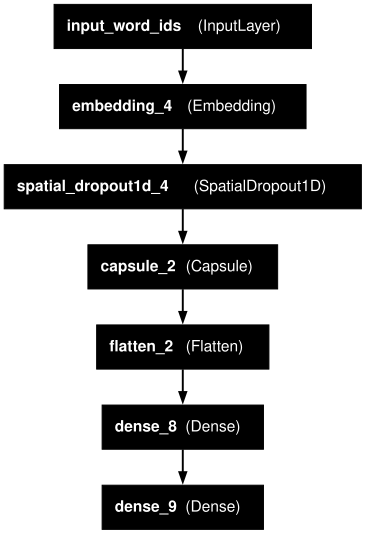

In [134]:
SVG(tf.keras.utils.model_to_dot(model_capsule, dpi=70).create(prog='dot', format='svg'))

In [156]:
visualize_model_preds(model_capsule)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
1. Non-toxic ✔

ORIGINAL
este usuario ni siquiera llega al rango de    hereje   . por lo tanto debería ser quemado en la barbacoa para purificar su alma y nuestro aparato digestivo mediante su ingestión.    skipe linkin 22px   honor, valor, leltad.      17:48 13 mar 2008 (utc)

TRANSLATED
This user does not even reach the rank of heretic. Therefore, he should be burned on the barbecue to purify his soul and our digestive system by ingesting him. skipe linkin 22px honor, valor, loyalty. 17:48 13 mar 2008 (utc)
2. Toxic ✖

ORIGINAL
in riguardo a cio  che ho pubblicato e tu hai già tolto dai maroni. lo trovo ingiusto e un po  comunista. sei pregato di non scassarmi il cazzo, e te lo chiedo gentilemnte. 

TRANSLATED
regarding what i posted and you already took off your balls. i find it unfair and a bit communist. please don't bother me, and i ask you kindly.
3. Non-toxic ✔

ORIGINAL
il testo di questa voce pare esser scopiazzato direttamente da qui. i

In [149]:
#Save Models
# Save the CNN model
model_cnn.save('cnn_model.h5')


In [150]:
# Save the LSTM model
model_lstm.save('lstm_model.h5')


In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Embedding, SpatialDropout1D, Flatten, Dense, Layer
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Define the Capsule layer
class Capsule(Layer):
    def __init__(self, num_capsule, dim_capsule, routings=3, activation=None, **kwargs):
        super(Capsule, self).__init__(**kwargs)
        self.num_capsule = num_capsule
        self.dim_capsule = dim_capsule
        self.routings = routings
        self.activation = activation

    def build(self, input_shape):
        # Your build logic for weights initialization here
        pass

    def call(self, inputs):
        # Your forward pass logic for the capsule layer here
        return inputs  # Modify this line with actual logic

    def squash(self, x):
        # Squashing function for capsule activation
        return (tf.square(x) / (tf.norm(x, axis=-1, keepdims=True) ** 2 + 1e-8)) * x

    def get_config(self):
        config = super(Capsule, self).get_config()
        config.update({
            "num_capsule": self.num_capsule,
            "dim_capsule": self.dim_capsule,
            "routings": self.routings,
            "activation": self.activation,
        })
        return config

def build_capsule_model(transformer, max_len):
    input_word_ids = Input(shape=(max_len,), dtype=tf.int32, name="input_word_ids")
    
    # Extract embedding weights from the transformer
    embed = transformer.weights[0].numpy()
    
    # Create the embedding layer
    embedding = Embedding(input_dim=np.shape(embed)[0],
                          output_dim=np.shape(embed)[1],
                          input_length=max_len,
                          weights=[embed],
                          trainable=False)(input_word_ids)
    
    # Apply spatial dropout to the embeddings
    embedding = SpatialDropout1D(0.3)(embedding)
    
    # Add the Capsule layer
    capsule = Capsule(num_capsule=5, dim_capsule=5, routings=4)(embedding)

    # Flatten the capsule output
    capsule = Flatten()(capsule)

    # Add dense layers for classification
    output = Dense(128, activation='relu')(capsule)
    output = Dense(1, activation='sigmoid')(output)
    
    # Create the model
    model = Model(inputs=input_word_ids, outputs=output)
    
    # Compile the model with an updated learning rate argument
    model.compile(optimizer=Adam(learning_rate=1.5e-5), 
                  loss='binary_crossentropy', 
                  metrics=['accuracy'])
    
    return model


In [153]:
with strategy.scope():
    model_capsule = build_capsule_model(transformer_layer, max_len=512)

model_capsule.summary()
# Save the Capsule Net model
model_capsule.save('capsule_net_model.h5')

print("Model saved successfully!")


Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_word_ids (InputLayer)     │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ embedding_5 (Embedding)         │ (None, 512, 768)       │    23,440,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ spatial_dropout1d_5             │ (None, 512, 768)       │             0 │
│ (SpatialDropout1D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ capsule_3 (Capsule)             │ (None, 512, 768)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 393216)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 128)            │    50,331,776 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 73,772,801 (281.42 MB)

 Trainable params: 50,331,905 (192.00 MB)

 Non-trainable params: 23,440,896 (89.42 MB)

Model saved successfully!


In [154]:
# Save the Capsule Net model
model_capsule.save('capsule_net_model.h5')


In [ ]:
!pip install gradio transformers matplotlib googletrans==4.0.0-rc1


In [141]:
from tensorflow.keras.layers import Layer

class AttentionWeightedAverage(Layer):
    def __init__(self, **kwargs):
        super(AttentionWeightedAverage, self).__init__(**kwargs)

    def build(self, input_shape):
        # Build the layer if needed
        pass

    def call(self, inputs):
        # Implement the forward pass for attention mechanism
        return inputs  # Modify this line with actual logic

    def get_config(self):
        config = super(AttentionWeightedAverage, self).get_config()
        return config


# Deploy Model

In [158]:
pip install gradio

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.3/42.3 MB 39.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 319.8/319.8 kB 22.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.4/76.4 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.0/78.0 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 89.9 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 4.9 MB/s eta 0:00:00
  Attempting uninstall: tomlkit
    Found existing installation: tomlkit 0.13.2
    Uninstalling tomlkit-0.13.2:
      Successfully uninstalled tomlkit-0.13.2
  Attempting uninstall: h11
    Found existing installation: h11 0.9.0
    Uninstalling h11-0.9.0:
      Successfully uninstalled h11-0.9.0
  Attempting uninstall: httpcore
    Found existing installation: httpcore 0.9.1
    Uninstalling httpcore-0.9.1:
      Successfully uninstalled httpcore-0.9.1
  Attempting uninstall: httpx
    Found existin

In [166]:
pip install streamlit


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.7/8.7 MB 54.5 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 86.4 MB/s eta 0:00:00:00:0100:01
Note: you may need to restart the kernel to use updated packages.


In [170]:
!pip uninstall httpx -y


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


Found existing installation: httpx 0.27.2
Uninstalling httpx-0.27.2:
  Successfully uninstalled httpx-0.27.2


In [171]:
!pip install httpx==0.23.3


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.5/71.5 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.6/69.6 kB 5.2 MB/s eta 0:00:00
  Attempting uninstall: httpcore
    Found existing installation: httpcore 1.0.6
    Uninstalling httpcore-1.0.6:
      Successfully uninstalled httpcore-1.0.6
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
googletrans 3.0.0 requires httpx==0.13.3, but you have httpx 0.23.3 which is incompatible.
gradio 5.1.0 requires httpx>=0.24.1, but you have httpx 0.23.3 which is incompatible.
gradio-client 1.4.0 requires httpx>=0.24.1, but you have httpx 0.23.3 which is incompatible.
jupyterlab 4.2.5 requires httpx>=0.25.0, but you have httpx 0.23.3 which is incompatible.
jupyterlab 4.2.5 requires jupyter-lsp>=2.0.0, but you have jupyter-lsp 1.5.1 which is incompatible.
jupyterlab-lsp 5.1.0 requires jupyter-lsp>=2.0.0,

In [173]:
import streamlit as st
import tensorflow as tf
import numpy as np
from tensorflow.keras.preprocessing.sequence import pad_sequences
from deep_translator import GoogleTranslator
import matplotlib.pyplot as plt
import seaborn as sns

# Load the trained CNN model
model = tf.keras.models.load_model('cnn_model.h5')

# Function to clean and preprocess the input
def preprocess_text(text, tokenizer, maxlen=512):
    # You can add more cleaning steps if needed, this is a basic example
    text = text.lower()
    tokens = tokenizer.texts_to_sequences([text])
    tokens_padded = pad_sequences(tokens, maxlen=maxlen, padding='post')
    return tokens_padded

# Translate function
def translate_text(text):
    translator = GoogleTranslator(source='auto', target='en')
    return translator.translate(text)

# Predict function
def classify_text(text, tokenizer):
    processed_text = preprocess_text(text, tokenizer)
    prediction = model.predict(processed_text)[0][0]
    return 'Toxic' if prediction > 0.5 else 'Non-toxic', prediction

# Visualization of the results
def visualize_prediction(prediction_score):
    plt.figure(figsize=(5, 5))
    sns.barplot(x=['Non-toxic', 'Toxic'], y=[1-prediction_score, prediction_score])
    plt.title("Toxicity Prediction Score")
    st.pyplot(plt)

# Main Streamlit app
def main():
    st.title("Toxic Comment Classifier")
    
    st.write("Enter a comment in any language, and this app will classify whether it's toxic or not.")
    
    # User input
    user_input = st.text_area("Enter your comment:", "")
    
    if user_input:
        # Step 1: Translate the comment to English
        translated_text = translate_text(user_input)
        st.write("**Translated Text:**", translated_text)
        
        # Step 2: Classify the translated text
        tokenizer = ...  # Load or create your tokenizer here
        label, score = classify_text(translated_text, tokenizer)
        st.write(f"**Classification:** {label}")
        st.write(f"**Prediction Score:** {score:.4f}")
        
        # Step 3: Visualize the prediction score
        visualize_prediction(score)

if __name__ == '__main__':
    main()


2024-10-15 19:49:53.607 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-10-15 19:49:53.607 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-10-15 19:49:53.608 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-10-15 19:49:53.609 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-10-15 19:49:53.610 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-10-15 19:49:53.611 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-10-15 19:49:53.612 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2024-10-15 19:49:53.612 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bar